# Turmell-Bot: Designing a Reconfigurable Tendon-Driven Robot for Human Ankle Therapy by Using Screw Theory

## Ángel Valera,<sup>1</sup> Julio H. Vargas-Riaño,<sup>1</sup> and Óscar Agudelo-Varela<sup>2</sup>
<sup>1</sup> Instituto de Automática e Informática Industrial (ai2), Universitat Politècnica de València, Camino de Vera, s/n,46022, Valencia, Spain.
<sup>2</sup> ,Facultad de Ciencias Básicas e Ingeniería, Vereda Barcelona, Km. 12 Vía Puerto López, Villavicencio, Meta, Colombia.


## Introduction
The Turmell-bot is a robot with human centered design. The model is based on the ankle model, antropometry, statistic measurements and proportions. 
We integrate proportions, and values to obtain a simplified ankle model.

In [1]:
#Transformation rotation about arbitrary axis
from sage.plot.plot3d.transform import rotate_arbitrary
#keywords
kw = {'aspect_ratio':[1,1,1], 'opacity':0.7, 'frame':False} 
#x, y, z axes
def xyzax(xmin=-1,xmax=1,ymin=-1,ymax=1,zmin=-1,zmax=1):
    ex =vector([1,0,0])
    ey =vector([0,1,0])
    ez =vector([0,0,1])
    G =  arrow3d(xmin*ex,xmax*ex,color='red',radius=0.5)
    G += arrow3d(ymin*ey,ymax*ey,color='green',radius=0.5)
    G += arrow3d(zmin*ez,zmax*ez,color='blue',radius=0.5)
    return G


## Computation of the talocrural direction vector
The talocrural and the subtalar axis are computed from the figure 1

<img src="ankleaxes.svg" alt="ankleaxes" width="400"/>
Figure 1. Subtalar and talocrural axis representation.

![meanaxis](meanaxis.svg)

Figure 2. Mean values for the subtalar axis [Isman & Inman, 1969] https://www.rehab.research.va.gov/jour/69/6/1/97.pdf

## Talocrural axis direction

In [2]:
#Anthropometric values mean values and standard deviation in degrees 
#(Isman & Inman, Anthropometric Studies of the Human Foot and Ankle, 1969)
#Talocrural direction related to sagittal and transverse planes in degrees.
tcm1=-6 #mean value (6=90-84)
tcsd1=7 #standard deviation

#three values, uncommment one
tcm1c=tcm1 #mean only
# tcm1c=tcm1+tcsd1 #plus standard deviation
# tcm1c=tcm1-tcsd1 #minus standard deviation

TCa1=(tcm1c)*(pi/180)

tcm2= 80 #mean value
tcsd2=4 #standard deviation

#three values, uncomment one
tcm2c=tcm2 #mean only 
# tcm2c=tcm2+tcsd2 #plus sd
# tcm2c=tcm2-tcsd2  #minus sd

TCa2=(tcm2c)*(pi/180)
#z unitary vector rotations about x, and z
vTC=rotate_arbitrary((0,0,1), TCa1)*rotate_arbitrary((1,0,0), TCa2)*vector([0,0,1])

## Subtalar axis direction

In [3]:
#Subtalar direction related to sagittal and transverse planes in degrees.
stm1=-23 #mean value (-23=0-23)
stsd1=11 #standard deviation

#three values, uncomment one
stm1c=stm1+stsd1 # mean only
# stm1c=stm1+stsd1 # plus sd
# stm1c=stm1-stsd1 # minus sd

STa1=(stm1c)*(pi/180)

stm2=41 #mean value
stsd2=9 #standard deviation

#three values, uncomment one
stm2c=stm2 #mean only
# stm2c=stm2+stsd2 #plus sd
# stm2c=stm2-stsd2 #minus sd

STa2=(stm2c)*(pi/180)

#x unitary vector rotations about z and y
vST=rotate_arbitrary((0,1,0), STa2)*rotate_arbitrary((0,0,1), STa1)*vector([1,0,0])

## Mean Anthropometric Distances

<img src="antthropometricklo.svg" alt="anttrhopometricklo" width="600"/>
Figure 3. K, L, O, and P anthropometric values.

<img src="AnthropometricWQ.svg" alt="AnthropometricWQ" width="400"/>
Figure 4. W and Q anthropometric values.

In [4]:
#Anthropometric distances in mm.
#K value
vkm=12
vksd=4
#tree values, uncomment one
vK=vkm
#vK=vkm+vksd
#vK=vkm-vksd

#L value
vlm=11
vlsd=4
#three values, uncomment one
vL=vlm
#vL=vlm+vlsd
#vL=vlm-vlsd

#O value
vom=16
vosd=4
# three values
vO=vom
#vO=vom+vosd
#vO=vom-vosd

#P value in mm
vpm=-1
vpsd=5
#three values
vP=vpm
#vP=vpm+vpsd
#vP=vpm-vpsd

#Q value
vqm=5
vqsd=3
#three values
vQ=vqm
# vQ=vqm+vqsd
# vQ=vqm-vqsd

# R value
vrm=0.54
vrsd=0.06
#three values
vR=vrm
#vR=vrm+vrsd
#vR=vrm-vrsd

## Base and Platform Dimensions
We used anthropometric statistical dimensions from [Fryar et al, 2021] https://pubmed.ncbi.nlm.nih.gov/33541517/.
Also, we used proportions from [Drillis & Contini, ] http://edge.rit.edu/edge/P13032/public/FinalDocuments/Detailed%20Analysis/Anthropometric%20Data/Drillis%20%26%20Contini.pdf


In [5]:
#(Anthropometric Reference Data for Children and Adults: United States, Fryar et al, Table 11)
vh_mean=1753 #height values all races, 20 and over
vh_max=1620.8 # 5th percentile
vh_min=1870.4 # 95th percentile
H=vh_mean
#H=vh_min 
# H=vh_max #heigth in mm
d_s=(0.285-0.039)*H/4 #knee-ankle quarter distance
d_p=0.039*H #ankle-foot
z_p=-(d_s+d_p) # z initial position 
r_p=(0.055*H)*1.2 # 120% foot heigth platform radius 
PO=vector([0,0,0]) #Origin at middle shank

#initial platform position
ae=pi/3
A0=vector([-r_p,0,z_p]) 
B0=vector([r_p*cos(ae),-r_p*sin(ae),z_p])
C0=vector([r_p*cos(ae),r_p*sin(ae),z_p])
PM0=(A0+B0+C0)/3 #center of the platform


In [6]:
print("Platform radius: ",r_p.n(digits=5))

Platform radius:  115.70


The platform's coordinated (local coordinates system) system is aligned with the origin (global coordinate system).

In [7]:
#normal vector
v1p=(B0-A0)
v2p=(C0-A0)
vn=v1p.cross_product(v2p)/norm(v1p.cross_product(v2p))
#direction vector
vd=(v1p+v2p)/norm(v1p+v2p)
print("vector n:",vn.n(digits=4),"vector d:",vd.n(digits=4))

vector n: (-0.0000, 0.0000, 1.000) vector d: (1.000, 0.0000, 0.0000)


## Initial position representation

In [8]:
#marker representation
dot=sphere(PO,2,color='red')
dot2=sphere(PO,4,color='green')
dPO=dot.translate(PO)
txo=vector([0,0,5])
tPO=text3d("PO", PO+txo, color=(0.5,0,0))
dA0=dot.translate(A0)
tA0=text3d("A0", A0+txo, color=(0.5,0,0))
dB0=dot.translate(B0)
tB0=text3d("B0", B0+txo, color=(0.5,0,0))
dC0=dot.translate(C0)
tC0=text3d("C0", C0+txo, color=(0.5,0,0))
dPM0=dot.translate(PM0)
tPM0=text3d("PM0", PM0+txo, color=(0.5,0,0))
#platform initial position
ptf= polygon([A0,B0,C0],color='gray',opacity=0.5)
tip=tPO+tA0+tB0+tC0+tPM0
dip=dPO+dA0+dB0+dC0+dPM0+ptf+tip
dip.show()
print("Base origin: ",PO.n(digits=5),"Platform origin: ",PM0.n(digits=5))
# dip.show(viewer='tachyon', 
#           figsize=[15,15], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1], # a distant camera position combined with 
#           zoom=2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.8,-4,-1.2), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

Base origin:  (0.00000, 0.00000, 0.00000) Platform origin:  (0.00000, 0.00000, -176.18)


## Axis Representation
The axis are represented by the points $r_1$ and $\omega_1$ for the  talocrural axis, and $r_2$, $\omega_2$ for the subtalar axis. The points $r_1$ and $r_2$ pertain to the sagittal plane, $M_1$ is lateral point and $M_2$ is medial point, computed from the foot's half witdth. The subtalar axis points are computed by dividing the foot's length in four parts.

### Talocrural axis representation

In [9]:
r_1=vector([0,0,-d_s]) #intersection point between the talocrural axis and the sagittal plane
fw=0.055*H  #foot width proportional to the heigth
fl=0.152*H  #foot length

#points on the malleolar lateral and medial sectors
M_1=r_1-fw*vR*vTC
M_2=r_1+fw*(1-vR)*vTC
print("foot w:",fw.n(digits=4),"foot l:",fl.n(digits=4),)
print("r_1:",r_1.n(digits=5)," M_1:",M_1.n(digits=4)," M_2:",M_2.n(digits=4))

foot w: 96.42 foot l: 266.5
r_1: (0.00000, 0.00000, -107.81)  M_1: (5.359, -50.99, -116.9)  M_2: (-4.565, 43.44, -100.1)


In [10]:
#marker representation
dr1=dot.translate(r_1)
tr1=text3d("r1", r_1+txo, color=(0.5,0,0))
dM1=dot.translate(M_1)
tM1=text3d("M1", M_1+txo, color=(0.5,0,0))
dM2=dot.translate(M_2)
tM2=text3d("M2", M_2+txo, color=(0.5,0,0))
tca=arrow3d(M_1,M_2,50)
ttc=text3d("TC Axis", M_2+2*txo, color=(0.5,0,0))
txtc=tr1+tM1+tM2+ttc
tcaxis=dr1+dM1+dM2+tca+txtc

### Subtalar axis representation

In [11]:
#subtalar axis and the sagittal plane intersection 
thtc=pi/2-STa2
vqd=vQ*vector([cos(thtc),0,-sin(thtc)])
r_2=r_1 + vqd
#points from the hindfoot to the midfoot
N_1=r_2-0.5*fl*vST
N_2=r_2+0.5*fl*vST
print("r_2:",r_2.n(digits=5)," N_1:",N_1.n(digits=4)," N_2:",N_2.n(digits=4))

r_2: (3.2803, 0.00000, -111.58)  N_1: (-95.07, -27.70, -197.1)  N_2: (101.6, 27.70, -26.09)


In [12]:
#markers representation
dr2=dot.translate(r_2)
tr2=text3d("r2", r_2+txo, color=(0.5,0,0))
dN1=dot.translate(N_1)
tN1=text3d("N1", N_1+txo, color=(0.5,0,0))
dN2=dot.translate(N_2)
tN2=text3d("N2", N_2+txo, color=(0.5,0,0))
sta=arrow3d(N_1,N_2,50)
tst=text3d("ST Axis", N_2+2*txo, color=(0.5,0,0))
txst=tr2+tN1+tN2+tst
staxis=dr2+dN1+dN2+sta+txst

In [13]:
# Both axis
gaxis=tcaxis+staxis
# Kinematics chain
kcn=line3d([PO,r_1,r_2,PM0],radius=2,color='pink')
# plus the platform ank kinematics chain
gaxis+=dip+kcn
gaxis.show()
# gaxis.show(viewer='tachyon', 
#           figsize=[15,15], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1], # a distant camera position combined with 
#           zoom=2.3, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.8,-4,-1.1), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)


Graphics3d Object

## Exponential Matrix Representation

In [14]:
#finding the twist unitary vectors 
w1=(M_2-M_1)/norm(M_2-M_1)
w2=(N_2-N_1)/norm(N_2-N_1)
#graphical representation
grw1=arrow3d(r_1,(r_1+w1*50),radius=1,color='orange')
grw2=arrow3d(r_2,(r_2+w2*50),radius=1,color='green')
print("omega_1",w1.n(digits=3),"omega_2=",w2.n(digits=3))

#the perpendicular component
v1=-w1.cross_product(r_1)
v2=-w2.cross_product(r_2)
# normalized
v1cp=v1/norm(v1)
v2cp=v2/norm(v2)
#graphical representation
grv1=arrow3d(r_1,(r_1+v1cp*50),radius=1,color='yellow')
grv2=arrow3d(r_2,(r_2+v2cp*50),radius=1,color='brown')

# all vectors
grvt=grw1+grw2+dr1+dr2+kcn #+grv1+grv2

print("nu_1",v1.n(digits=3),"nu_2=",v2.n(digits=3))
#angles for the talocrural and subtalar rotations
theta1=var('theta_1')
theta2=var('theta_2')

omega_1 (-0.103, 0.979, 0.174) omega_2= (0.738, 0.208, 0.642)
nu_1 (106., 11.1, 0.000) nu_2= (23.2, -84.5, 0.682)


In [15]:
# Intersection of the axes projected on the xy plane 
x,y=var('x,y')
P=vector([x,y])
lin1=(P[0]-r_1[0])/w1[0]==(P[1]-r_1[1])/w1[1]
lin2=(P[0]-r_2[0])/w2[0]==(P[1]-r_2[1])/w2[1]
intx=solve([lin1,lin2],x,y)[0][0].rhs()
inty=solve([lin1,lin2],x,y)[0][1].rhs()
print("Intersection projected lines: ",intx.n(digits=5),inty.n(digits=5))

Intersection projected lines:  0.094310 -0.89730


In [16]:
# Rotation axis in a unitary vector and angle in degrees
def rot_ax_ang(u,a):
    #degrees to radians
    alpha=a*pi/180
    na=(1-cos(alpha))
    ca=cos(alpha)
    sa=sin(alpha)
    #rotation matrix
    R=matrix([[u[0]^2*na+ca, u[0]*u[1]*na-u[2]*sa, u[0]*u[2]*na+u[1]*sa],
            [u[0]*u[1]*na+u[2]*sa, u[1]^2*na+ca, u[1]*u[2]*na-u[0]*sa],
            [u[2]*u[0]*na-u[1]*sa, u[2]*u[1]*na+u[0]*sa, u[2]^2*na+ca]])
    return R
#transformation of exponential matrix of rotation
Rexp1=rot_ax_ang(w1,theta1)
#rotation matrix component of the homogeneous transformation
vexp1=(matrix.identity(3)-Rexp1)*(w1.cross_product(v1))

#conformation of the homogeneous transformation matrix
MTH1=(Rexp1.augment(vexp1)).stack(vector([0,0,0,1]))

#components for the subtalar axis
Rexp2=rot_ax_ang(w2,theta2)
vexp2=(matrix.identity(3)-Rexp2)*(w2.cross_product(v2))
MTH2=(Rexp2.augment(vexp2)).stack(vector([0,0,0,1]))

#transformation matrix representing the initial position
gst0A=matrix([[1,0,0,A0[0]],[0,1,0,A0[1]],[0,0,1,A0[2]],[0,0,0,1]])
gst0B=matrix([[1,0,0,B0[0]],[0,1,0,B0[1]],[0,0,1,B0[2]],[0,0,0,1]])
gst0C=matrix([[1,0,0,C0[0]],[0,1,0,C0[1]],[0,0,1,C0[2]],[0,0,0,1]])
gst0PM=matrix([[1,0,0,PM0[0]],[0,1,0,PM0[1]],[0,0,1,PM0[2]],[0,0,0,1]])

#product of exponential matrices for all the points
MTHA=MTH1*MTH2*gst0A
MTHB=MTH1*MTH2*gst0B
MTHC=MTH1*MTH2*gst0C
MTHPM=MTH1*MTH2*gst0PM

#components of the group of rigid movements for the central point
f_xpm=MTHPM[0][3]
f_ypm=MTHPM[1][3]
f_zpm=MTHPM[2][3]
#orthogonal direction vectors
f_spm=vector([MTHPM[0][0],MTHPM[1][0],MTHPM[2][0]])
f_npm=vector([MTHPM[0][1],MTHPM[1][1],MTHPM[2][1]])
f_apm=vector([MTHPM[0][2],MTHPM[1][2],MTHPM[2][2]])

#components of the vertices of the plattform
f_xA=MTHA[0][3]
f_yA=MTHA[1][3]
f_zA=MTHA[2][3]
f_xB=MTHB[0][3]
f_yB=MTHB[1][3]
f_zB=MTHB[2][3]
f_xC=MTHC[0][3]
f_yC=MTHC[1][3]
f_zC=MTHC[2][3]
# pretty_print(MTHA[2][3].simplify_full().subs(theta_1==180/pi*theta_1,theta_2==180/pi*theta_2))
# latex((MTHA[2][3]).simplify_full().subs(theta_1==180/pi*theta_1,theta_2==180/pi*theta_2))
# (MTHA[2][3]).simplify_full().subs(theta_1==180/pi*theta_1,theta_2==180/pi*theta_2)

In [17]:
#Talocrural rotation (Mann's Surgery of the foot and Ankle, 9th, chapter 1)
t1min=-20
t1max=20
#Subtalar rotation
t2min=-15
t2max=15
dp=30 #data points
cpm=parametric_plot3d([f_xpm, f_ypm, f_zpm],(theta_1, t1min, t1max), 
                        (theta_2, t2min, t2max),plot_points=[dp,dp])
cA=parametric_plot3d([f_xA, f_yA, f_zA], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="cyan")
cB=parametric_plot3d([f_xB, f_yB, f_zB], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="magenta")
cC=parametric_plot3d([f_xC, f_yC, f_zC], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="yellow")

#sphere malleolar radius
radiusmax = sphere(r_1,0.055*H/2, opacity=0.5,color='pink')


In [18]:
fkin=cpm+cA+cB+cC+grvt+dip
fkin.show()
# fkin.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1], # a distant camera position combined with 
#           zoom=2.2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-4,-1.1), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)


Graphics3d Object

## Left foot representation
We introduce the left foot representation by reflecting the right foot referencing points and vectors.

In [19]:
# Reflected vectors about xz plane (y = 0)
#in vector form
vj=vector([0,1,0]) #vector normal to xz plane

# reflection matrix 
nj=matrix(3,1,vj) #column vector
njt=matrix(1,3,vj) # column vector transposed
mrf=matrix.identity(3)-2*nj*njt
pretty_print("reflection matrix:",mrf)

'reflection matrix:' [ 1  0  0]
[ 0 -1  0]
[ 0  0  1]

In [20]:
#reference points reflection
A0l=mrf*A0
B0l=mrf*B0
C0l=mrf*C0
M_1l=mrf*M_1
M_2l=mrf*M_2
N_1l=mrf*N_1
N_2l=mrf*N_2
#r1 and r2 are the same because they are on the sagittal plane
r_1l=mrf*r_1
r_2l=mrf*r_2
print("A0 left: ",A0l.n(digits=5),"B0 left: ",B0l.n(digits=5),"C0 left: ",C0l.n(digits=5))
print("M1 left: ",M_1l.n(digits=5),"M2 left: ",M_2l.n(digits=5))
print("N1 left: ",N_1l.n(digits=5),"N2 left: ",N_2l.n(digits=5))
print("r1 left: ",r_1l.n(digits=5),"r2 left: ",r_2l.n(digits=5))

A0 left:  (-115.70, 0.00000, -176.18) B0 left:  (57.849, 100.20, -176.18) C0 left:  (57.849, -100.20, -176.18)
M1 left:  (5.3595, 50.992, -116.85) M2 left:  (-4.5655, -43.438, -100.11)
N1 left:  (-95.071, 27.700, -197.08) N2 left:  (101.63, -27.700, -26.088)
r1 left:  (0.00000, 0.00000, -107.81) r2 left:  (3.2803, 0.00000, -111.58)


In [21]:
#graphics left foot representation
dM1l=dot.translate(M_1l)
tM1l=text3d("M1l", M_1l+txo, color=(0.5,0,0))
dM2l=dot.translate(M_2l)
tM2l=text3d("M2l", M_2l+txo, color=(0.5,0,0))
dN1l=dot.translate(N_1l)
tN1l=text3d("N1l", N_1l+txo, color=(0.5,0,0))
dN2l=dot.translate(N_2l)
tN2l=text3d("N2l", N_2l+txo, color=(0.5,0,0))
dA0l=dot.translate(A0l)
tA0l=text3d("A0l", A0l+txo, color=(0.5,0,0))
dB0l=dot.translate(B0l)
tB0l=text3d("B0l", B0l+txo, color=(0.5,0,0))
dC0l=dot.translate(C0l)
tC0l=text3d("C0l", C0l+txo, color=(0.5,0,0))

#platform left initial position
ptfl= polygon([A0l,B0l,C0l],color='gray',opacity=1)
tipl=tPO+tA0l+tB0l+tC0l #text
dipl=dPO+dA0l+dB0l+dC0l+ptfl+tipl #points
# dipl.show()

In [22]:
#axis left
tcal=arrow3d(M_1l,M_2l,50)
ttcl=text3d("TC Axis left", M_2l+2*txo, color=(0.5,0,0))
txtcl=tr1+tM1l+tM2l+ttcl
tcaxisl=dr1+dM1l+dM2l+tcal+txtcl
stal=arrow3d(N_1l,N_2l,50)
tstl=text3d("ST Axis left", N_2l+2*txo, color=(0.5,0,0))
txstl=tr2+tN1l+tN2l+tstl
staxisl=dr2+dN1l+dN2l+stal+txstl
# Both axis
gaxisl=tcaxisl+staxisl
# gaxisl.show()

We don't have to recompute all the group of movements, reflecting the points and plotting gives us the left foot data.

In [23]:
#components of the vertices of the plattform
Al=mrf*vector([f_xA, f_yA, f_zA])
cAl=parametric_plot3d(Al, (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="cyan")
Bl=mrf*vector([f_xB, f_yB, f_zB])
cBl=parametric_plot3d(Bl, (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="magenta")
Cl=mrf*vector([f_xC, f_yC, f_zC])
cCl=parametric_plot3d(Cl, (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="yellow")

In [24]:
# Plotting the group of movements, the axis and the platform and the kinematic chain
fkinl=cAl+cBl+cCl+gaxisl+dipl+kcn
# fkinl.show()
# fkinl.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1], # a distant camera position combined with 
#           zoom=2.2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.8,-4,-1.1), # slightly off-center
#           updir=(0,0,1), #the camera is slightly tilted
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

## Base representation
The base must be greater than the platform for avoiding collision with the body, represented by a sphere with radius equal to the foot width, centered on $r_1$

In [25]:
#base must be greater than the base for avoid collision with the body
r_b=1.3*r_p
Ab=vector([-r_b,0,0]) 
Bb=vector([r_b*cos(ae),-r_b*sin(ae),0])
Cb=vector([r_b*cos(ae),r_b*sin(ae),0])
basep= polygon([Ab,Bb,Cb],color='green',opacity=0.3)
# sensor modules translated to the vertices
r_m=30
ds1=vector([r_m,0,0])
ds2=vector([-r_m*cos(ae),r_m*sin(ae),0])
ds3=vector([-r_m*cos(ae),-r_m*sin(ae),0])

print("Platform radius:",r_p.n(digits=4),"Base radius:",r_b.n(digits=4),"Module radius:",r_m.n(digits=4))
print("Base A: ",Ab.n(digits=4),"Base B: ",Bb.n(digits=4),"Base C: ",Cb.n(digits=4))
print("Sensor 1: ",ds1.n(digits=4),"Sensor 2: ",ds2.n(digits=4),"Sensor 3: ",ds3.n(digits=4))

Platform radius: 115.7 Base radius: 150.4 Module radius: 30.00
Base A:  (-150.4, 0.0000, 0.0000) Base B:  (75.20, -130.3, 0.0000) Base C:  (75.20, 130.3, 0.0000)
Sensor 1:  (30.00, 0.0000, 0.0000) Sensor 2:  (-15.00, 25.98, 0.0000) Sensor 3:  (-15.00, -25.98, 0.0000)


In [26]:
#module A
ds1A=ds1+Ab
ds2A=ds2+Ab
ds3A=ds3+Ab
ps1A=dot.translate(ds1A)
ps2A=dot.translate(ds2A)
ps3A=dot.translate(ds3A)
mdA=polygon([ds1A,ds2A,ds3A],opacity=0.3)+ps1A+ps2A+ps3A
print("Point 1A: ",ds1A.n(digits=4),"Point 2A: ",ds2A.n(digits=4),"Point 3A: ",ds3A.n(digits=4))

Point 1A:  (-120.4, 0.0000, 0.0000) Point 2A:  (-165.4, 25.98, 0.0000) Point 3A:  (-165.4, -25.98, 0.0000)


In [27]:
#module B
ds1B=ds1+Bb
ds2B=ds2+Bb
ds3B=ds3+Bb
ps1B=dot.translate(ds1B)
ps2B=dot.translate(ds2B)
ps3B=dot.translate(ds3B)
mdB=polygon([ds1B,ds2B,ds3B],opacity=0.3)+ps1B+ps2B+ps3B
print("Point 1B: ",ds1B.n(digits=4),"Point 2B: ",ds2B.n(digits=4),"Point 3B: ",ds3B.n(digits=4))

Point 1B:  (105.2, -130.3, 0.0000) Point 2B:  (60.20, -104.3, 0.0000) Point 3B:  (60.20, -156.2, 0.0000)


In [28]:
#Module C
ds1C=ds1+Cb
ds2C=ds2+Cb
ds3C=ds3+Cb
ps1C=dot.translate(ds1C)
ps2C=dot.translate(ds2C)
ps3C=dot.translate(ds3C)
mdC=polygon([ds1C,ds2C,ds3C],opacity=0.3)+ps1C+ps2C+ps3C
print("Point 1C: ",ds1C.n(digits=4),"Point 2C: ",ds2C.n(digits=4),"Point 3C: ",ds3C.n(digits=4))

Point 1C:  (105.2, 130.3, 0.0000) Point 2C:  (60.20, 156.2, 0.0000) Point 3C:  (60.20, 104.3, 0.0000)


In [29]:
#base plot
gbase=basep+mdA+mdB+mdC
#add to kinematic model
baskin=fkin+gbase
baskin.show()
# baskin.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.5], # a distant camera position combined with 
#           zoom=2.6, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-3.9,-1.5), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

## Sensor Lengths and Position
for validation we compute the sensor lenghts in the initial position, the lengt for each sensor is $l_{s1A}=\| A_0-d_{s1A} \|$

In [30]:
#sensor lengths at the initial positon
# module A
ls1A=norm(A0-ds1A)
ls2A=norm(A0-ds2A)
ls3A=norm(A0-ds3A)
# graphics
gs1A=line3d([ds1A,A0],color='gray', size=1)
gs2A=line3d([ds2A,A0],color='gray', size=1)
gs3A=line3d([ds3A,A0],color='gray', size=1)
gmA0=gs1A+gs2A+gs3A
print("Lenght l1A:", ls1A.n(digits=4),"Lenght l2A:", ls2A.n(digits=4), "Lenght l3A:",ls3A.n(digits=4))

Lenght l1A: 176.2 Lenght l2A: 184.9 Lenght l3A: 184.9


In [31]:
#module B
ls1B=norm(B0-ds1B)
ls2B=norm(B0-ds2B)
ls3B=norm(B0-ds3B)
# graphics
gs1B=line3d([ds1B,B0],color='gray', size=1)
gs2B=line3d([ds2B,B0],color='gray', size=1)
gs3B=line3d([ds3B,B0],color='gray', size=1)
gmB0=gs1B+gs2B+gs3B
print("Lenght l1B:", ls1B.n(digits=4),"Lenght l2B:", ls2B.n(digits=4), "Lenght l3B:",ls3B.n(digits=4))

Lenght l1B: 184.9 Lenght l2B: 176.2 Lenght l3B: 184.9


In [32]:
#module C
ls1C=norm(C0-ds1C)
ls2C=norm(C0-ds2C)
ls3C=norm(C0-ds3C)
# graphics
gs1C=line3d([ds1C,C0],color='gray', size=1)
gs2C=line3d([ds2C,C0],color='gray', size=1)
gs3C=line3d([ds3C,C0],color='gray', size=1)
gmC0=gs1C+gs2C+gs3C
print("Lenght l1C:", ls1C.n(digits=4),"Lenght l2C:", ls2C.n(digits=4), "Lenght l3C:",ls3C.n(digits=4))

Lenght l1C: 184.9 Lenght l2C: 184.9 Lenght l3C: 176.2


Graphic representation for the sensor lenghts at the initial position

In [33]:
grsl=gmA0+gmB0+gmC0+baskin
# grsl.show()
# grsl.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.5], # a distant camera position combined with 
#           zoom=2.6, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-3.9,-1.5), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Function for computing the relative position from the lenghts

In [34]:
def pos(l_1,l_2,l_3):
    ys = -1/6*sqrt(3)*(l_2^2 - l_3^2)/r_m
    xs = -1/6*(2*l_1^2 - l_2^2 - l_3^2)/r_m
    zs =-1/3*sqrt(-l_1^4 + l_1^2*l_2^2 - l_2^4 - l_3^4 - 9*r_m^4 
                  + (l_1^2 + l_2^2)*l_3^2 + 3*(l_1^2 + l_2^2 + l_3^2)*r_m^2)/r_m
    vsol=vector([xs,ys,zs])
    return vsol

In [35]:
sA0=pos(ls1A,ls2A,ls3A)+Ab
sB0=pos(ls1B,ls2B,ls3B)+Bb
sC0=pos(ls1C,ls2C,ls3C)+Cb

print("Original", "A0:", A0.n(digits=5),"B0:",B0.n(digits=5),"C0:",C0.n(digits=5))
print("Estimation", "A0:", sA0.n(digits=5),"B0:",sB0.n(digits=5),"C0:",sC0.n(digits=5))

Original A0: (-115.70, 0.00000, -176.18) B0: (57.849, -100.20, -176.18) C0: (57.849, 100.20, -176.18)
Estimation A0: (-115.70, -0.00000, -176.18) B0: (57.849, -100.20, -176.18) C0: (57.849, 100.20, -176.18)


## Trajectory generation
Trajectories generated from the ankle model. Plantarflexion, dorsiflexion, inversion and eversion cases.

In [36]:
# number of sample values
nvl=50
# Generating trajectories for talocrural axis
degrange=t1max-t1min
ins=degrange/(nvl-1)
t2ka=MTH1*gst0A
t2kb=MTH1*gst0B
t2kc=MTH1*gst0C

In [37]:
#function for A
def ty_A(i,j):
    sv=i*ins+t1min
    if j==0 :
        return t2ka[0][3].subs(theta_1=sv).n(digits=5)
    if j==1 :
        return t2ka[1][3].subs(theta_1=sv).n(digits=5)
    if j==2 :
        return t2ka[2][3].subs(theta_1=sv).n(digits=5)
mtyA=matrix(nvl,3,lambda i, j:ty_A(i,j))
# graphics trajectory A
grtyA=line3d(mtyA, color= 'cyan')

In [38]:
#function for B
def ty_B(i,j):
    sv=i*ins+t1min
    if j==0 :
        return t2kb[0][3].subs(theta_1=sv).n(digits=5)
    if j==1 :
        return t2kb[1][3].subs(theta_1=sv).n(digits=5)
    if j==2 :
        return t2kb[2][3].subs(theta_1=sv).n(digits=5)
mtyB=matrix(nvl,3,lambda i, j:ty_B(i,j))
# graphics trajectory B
grtyB=line3d(mtyB,color='magenta')

In [39]:
#function for C
def ty_C(i,j):
    sv=i*ins+t1min
    if j==0 :
        return t2kc[0][3].subs(theta_1=sv).n(digits=5)
    if j==1 :
        return t2kc[1][3].subs(theta_1=sv).n(digits=5)
    if j==2 :
        return t2kc[2][3].subs(theta_1=sv).n(digits=5)
mtyC=matrix(nvl,3,lambda i, j:ty_C(i,j))
# graphics trajectory C
grtyC=line3d(mtyC, color ='yellow')

In [40]:
galty = grtyA+grtyB+grtyC+gbase+grvt+dip
# galty.show()
# galty.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.5], # a distant camera position combined with 
#           zoom=2.6, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-3.9,-1.5), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

In [41]:
#Generating trajectories for subtalar axis
t2max=15
t2min=-15
degrange2=t2max-t2min
ins2=degrange2/(nvl-1)
t1ka=MTH2*gst0A
t1kb=MTH2*gst0B
t1kc=MTH2*gst0C


In [42]:
#function for A
def ty_A2(i,j):
    sv=i*ins2+t2min
    if j==0 :
        return t1ka[0][3].subs(theta_2=sv).n(digits=5)
    if j==1 :
        return t1ka[1][3].subs(theta_2=sv).n(digits=5)
    if j==2 :
        return t1ka[2][3].subs(theta_2=sv).n(digits=5)
mtyA2=matrix(nvl,3,lambda i, j:ty_A2(i,j))
# graphics trajectory A
grtyA2=line3d(mtyA2, color= 'cyan')

In [43]:
#function for B
def ty_B2(i,j):
    sv=i*ins2+t2min
    if j==0 :
        return t1kb[0][3].subs(theta_2=sv).n(digits=5)
    if j==1 :
        return t1kb[1][3].subs(theta_2=sv).n(digits=5)
    if j==2 :
        return t1kb[2][3].subs(theta_2=sv).n(digits=5)
mtyB2=matrix(nvl,3,lambda i, j:ty_B2(i,j))
# graphics trajectory B
grtyB2=line3d(mtyB2,color='magenta')

In [44]:
#function for C
def ty_C2(i,j):
    sv=i*ins2+t2min
    if j==0 :
        return t1kc[0][3].subs(theta_2=sv).n(digits=5)
    if j==1 :
        return t1kc[1][3].subs(theta_2=sv).n(digits=5)
    if j==2 :
        return t1kc[2][3].subs(theta_2=sv).n(digits=5)
mtyC2=matrix(nvl,3,lambda i, j:ty_C2(i,j))
# graphics trajectory C
grtyC2=line3d(mtyC2, color ='orange')

In [45]:
galty2 = grtyA2+grtyB2+grtyC2+grw2+dip+kcn
galty2.show()
# galty2.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.4], # a distant camera position combined with 
#           zoom=2.3, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-4,-1.6), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [46]:
# Trajectory A for talocrural fitting
galtyA = grtyA+grw1+kcn+dip
galtyA.show()
# galtyA.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.5], # a distant camera position combined with 
#           zoom=2.2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-3.9,-1.6), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [47]:
# Trajectory A for talocrural fitting
galtyB = grtyB+grw1+kcn+dip
galtyB.show()
# galtyB.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.6], # a distant camera position combined with 
#           zoom=2.2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-4,-1.8), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [48]:
# Trajectory A for talocrural fitting
galtyC = grtyC+grw1+kcn+dip
galtyC.show()
# galtyC.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.6], # a distant camera position combined with 
#           zoom=2.2, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.7,-4,-1.8), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [49]:
#select one trajectory for the talocrural axis
tys=mtyA
# tys=mtyB
# tys=mtyC

In [50]:
#select one trajectory for the subtalar axis
# tys=mtyA2
# tys=mtyB2
# tys=mtyC2

## Least square method for the plane estimation
We created the matrix A and B for the normal axis estimation.

In [51]:
#matrix A and vector B from the trajectories data
tys01=tys.delete_columns([2])
vcones=ones_matrix(nvl,1)
# matrix A and B for the plane vector normal estimation
mAp=tys01.augment(vcones)
vBp=vector(tys.delete_columns([0,1]))

In [52]:
#finding a, b and d
psAp=mAp.pseudoinverse()
sabd=psAp*vBp
aval=sabd[0]
bval=sabd[1]
dval=sabd[2]
# selecting C=-1000 for numerical precision
#unitary normal vector to plane
npl = vector([aval, bval, -1])*(-1000)
nsu=npl/norm(npl)
print("Normal vector:",npl)
print("Unitary normal vector:",nsu)

Normal vector: (-592.80, 5640.3, 1000.0)
Unitary normal vector: (-0.10294, 0.97941, 0.17365)


In [53]:
#angle and axis with XY plane
vz=vector([0,0,1000])
dprod=(npl.dot_product(vz))/(norm(npl)*norm(vz))
arot=acos(dprod)
cprod=npl.cross_product(vz)
rvec=cprod/norm(cprod)
print("angle:",(arot*180/pi).n(digits=5),"axis:",rvec)

angle: 80.000 axis: (0.99452, 0.10453, -0.00000)


In [54]:
#Rotate the trajectory points
tysr=matrix(rot_ax_ang(rvec,arot*180/pi)*tys[i] for i in range(nvl))

In [55]:
#generate the matrix and vector for the circle estimation
tysr01=tysr.delete_columns([2])
mAc=tysr01.augment(vcones)
vBc=vector([tysr[i,0]*tysr[i,0] + tysr[i,1]*tysr[i,1] for i in range(nvl)])
#approximation
psAc=mAc.pseudoinverse()
chi=psAc*vBc

In [56]:
import numpy
#substituting to the coordinates and centre
xc,yc,zx,rc=var('xc,yc,zc,rc')
eqc1=2*xc==chi[0]
eqc2=2*yc==chi[1]
eqc3=rc^2-xc^2-yc^2==chi[2]
slnc=solve([eqc1,eqc2,eqc3],[rc,xc,yc])
tcr=slnc[0][0].rhs().n()
tcxc=slnc[0][1].rhs().n()
tcyc=slnc[0][2].rhs().n()
#averaging the z component of the plane parallel to xy
tczc=numpy.mean(tysr.delete_columns([0,1]))
crot=vector([tcxc,tcyc,tczc])
print("center parallel to xy: ",crot.n(digits=4),"radius: ",tcr.n(digits=4))

center parallel to xy:  (-10.63, 105.1, -18.68) radius:  135.7


In [57]:
#defining the parametric circle 
uvpr=rvec
vvpr=(vz.cross_product(uvpr))/norm(vz.cross_product(uvpr))
t=var('t')
cirpar=crot+tcr*(uvpr*cos(t) + vvpr*sin(t))
plcir=parametric_plot3d(cirpar,(t,-pi,pi),color='aquamarine')

In [58]:
#rotating back the center
cptc=rot_ax_ang(rvec,-arot*180/pi)*crot
print("Trajectory center: ",cptc)

Trajectory center:  (0.41458, -0.010956, -107.28)


In [59]:
#scale factor for graphs
sc=50
dcrot=dot.translate(crot)+text3d("crot", crot+txo, color=(0.5,0,0))
dcptc=dot.translate(cptc)+text3d("cptc", cptc+txo, color=(0.5,0,0))
w1arw=arrow3d(cptc, cptc + sc*nsu,width=sc, color ='green')
r1arw=arrow3d(PO, cptc ,width=sc, color ='green')
plpmat=line3d(tys,radius=3,color='red')
plpmatr=line3d(tysr,radius=3,color='purple')
plt=dcrot + dcptc + plpmat + plpmatr + w1arw + r1arw + plcir + dip + kcn
plt.show()
# plt.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 1.7], # a distant camera position combined with 
#           zoom=3.1, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.55,-3.7,-1.7), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [60]:
#mean for rotation axes of the trajectories.
axtA=vector([-0.10295, 0.97941, 0.17364])
axtB=vector([-0.10293, 0.97942, 0.17364])
axtC=vector([-0.10294, 0.97941, 0.17364])
axtmn=((axtA+axtB+axtC)/3)/norm((axtA+axtB+axtC)/3)
print("Mean talocrural rotation axis: ",axtmn.n(digits=5))

Mean talocrural rotation axis:  (-0.10294, 0.97941, 0.17364)


In [61]:
#mean for the computed centers of the trajectories.
ctyA=vector([0.34535, 0.098175, -107.93])
ctyB=vector([13.265, -113.37, -128.29])
ctyC=vector([-11.603, 77.660, -90.225])
ctymn=(ctyA+ctyB+ctyC)/3
print("Mean talocrural center: ",ctymn.n(digits=5))

Mean talocrural center:  (0.66912, -11.871, -108.81)


In [62]:
# the momentum measured estimation v1me
v1me=-axtmn.cross_product(ctymn)
nv1e=v1me/norm(v1me)
show(LatexExpr(r"[\omega_1,\nu_1]"))
print("Original vector: ",[w1.n(digits=5),v1.n(digits=5)])
print("Estimated vector: ",[axtmn.n(digits=5),v1me.n(digits=5)])
pretty_print(LatexExpr(r'|\omega_{1o}-\omega_{1e}| = '),norm(axtmn-w1).n(digits=5))
pretty_print(LatexExpr(r'|\nu_{1o} -\nu_{1e}| = '), norm(v1-v1me).n(digits=5))

[\omega_1,\nu_1]

Original vector:  [(-0.10294, 0.97941, 0.17365), (105.59, 11.098, 0.00000)]
Estimated vector:  [(-0.10294, 0.97941, 0.17364), (104.51, 11.085, -0.56662)]


|\omega_{1o}-\omega_{1e}| =  8.1395e-6

|\nu_{1o} -\nu_{1e}| =  1.2164

In [63]:
#mean for subtalar axis of the trajectories.
axtA2=vector([0.73827, 0.20787, 0.64167])
axtB2=vector([0.73823, 0.20790, 0.64171])
axtC2=vector([0.73821, 0.20789, 0.64174])
axtmn2=((axtA2+axtB2+axtC2)/3)/norm((axtA2+axtB2+axtC2)/3)
print("Mean subtalar rotation axis: ",axtmn2.n(digits=5))

Mean subtalar rotation axis:  (0.73824, 0.20789, 0.64171)


In [64]:
#mean for subtalar center of the trajectories.
ctyA2=vector([-95.929, -22.830, -191.53])
ctyB2=vector([-13.335, -4.1798, -125.39])
ctyC2=vector([17.795, 3.6453, -98.822])
ctymn2=(ctyA2+ctyB2+ctyC2)/3
print("Mean subtalar center: ",ctymn2.n(digits=5))

Mean subtalar center:  (-30.490, -7.7882, -138.58)


In [65]:
# the momentum measured estimation v2me
v2me=-axtmn2.cross_product(ctymn2)
nv2e=v2me/norm(v2me)
show(LatexExpr(r"[\omega_2,\nu_2]"))
print("Original vector: ",[w2.n(digits=5),v2.n(digits=5)])
print("Estimated vector: ",[axtmn2.n(digits=5),v2me.n(digits=5)])
print("Distance omega_2: ",norm(axtmn2-w2).n(digits=5))
print("Distance nu_2: ", norm(v2-v2me).n(digits=5))

[\omega_2,\nu_2]

Original vector:  [(0.73822, 0.20791, 0.64172), (23.199, -84.478, 0.68201)]
Estimated vector:  [(0.73824, 0.20789, 0.64171), (23.811, -82.740, -0.58889)]
Distance omega_2:  0.000035358
Distance nu_2:  2.2381


## Range of motion computation

### From all the data n=50

In [66]:
#measured normal vector to the platform, uncomment for talocrural or subtalar trajectories
vabm=mtyB-mtyA
vacm=mtyC-mtyA
# vabm=mtyB2-mtyA2
# vacm=mtyC2-mtyA2
cpabc=[(vabm[i].cross_product(vacm[i])) for i in range(nvl)]
unvm=[cpabc[i]/norm(cpabc[i]) for i in range(nvl)]
# show(matrix(unvm))

In [67]:
#measured unitary direction vector
sabc=vabm+vacm
udvm=[sabc[i]/norm(sabc[i]) for i in range(nvl)]
# show(matrix(udvm))

In [68]:
# perpendicular unitary vector
upvm=[unvm[i].cross_product(udvm[i]) for i in range(nvl)]
# show(matrix(upvm))

In [69]:
# measured rotation matrix
rmxmd = [matrix([udvm[i],upvm[i],unvm[i]]).T for i in range(nvl)]
angm=[arccos(0.5*(rmxmd[i].trace()-1)) for i in range(nvl)]
epsilon=min(angm)
r2g=180/pi.n(digits=10)
epsilon

0.0073079

In [70]:
# define the angle measured next to the zero position
# select the position
zpos=[i for i in range(nvl) if abs(angm[i])<=epsilon]
# the maximum negative angle
nang=[angm[i] for i in range(nvl) if i<zpos[0]]
mna = - max(nang)
# the maximum positive angle
pang = [angm[i] for i in range(nvl) if i>zpos[0]]
mpa = max(pang)
print("the measured talocrural range of motion is: ",(mpa-mna)*r2g)

the measured talocrural range of motion is:  40.000


In [71]:
# The skew-symmetric matrix.
skwsm = [1/(2*sin(angm[i]))*(rmxmd[i]-rmxmd[i].T) for i in range(nvl) if i < zpos[0]]
# The rotation vector
vvect = [vector([skwsm[i][1][2],skwsm[i][2][0],skwsm[i][0][1]]) for i in range(zpos[0])]
# The mean rotation vector
prmvec = sum(vvect)/zpos[0]
print("The validated rotation vector: ",prmvec)

The validated rotation vector:  (-0.10290, 0.97898, 0.17357)


### From decimated data n = 10

In [72]:
# decimated results for trajectory a
# crpA0=mtyA[0].cross_product(A0)
crpA0=mtyA2[0].cross_product(A0)
# the positive angles regarding A0
# dptyA=matrix([mtyA[i] for i in range(nvl) if crpA0.dot_product(mtyA[i].cross_product(A0)) > 0 and i%5==0 ])
dptyA=matrix([mtyA2[i] for i in range(nvl) if crpA0.dot_product(mtyA2[i].cross_product(A0)) > 0 and i%5==0 ])
# the negative angles 
# dntyA=matrix([mtyA[i] for i in range(nvl) if crpA0.dot_product(mtyA[i].cross_product(A0)) < 0 and (i+1)%5==0])
dntyA=matrix([mtyA2[i] for i in range(nvl) if crpA0.dot_product(mtyA2[i].cross_product(A0)) < 0 and (i+1)%5==0])
dntyA

[-116.32 -1.4090 -175.01]
[-116.94 -3.0435 -173.76]
[-117.49 -4.7460 -172.58]
[-117.97 -6.5117 -171.46]
[-118.37 -8.3355 -170.40]

In [73]:
# decimated results for trajectory b
# crpB0=mtyB[0].cross_product(B0)
crpB0=mtyB2[0].cross_product(B0)
# the positive angles regarding B0
# dptyB=matrix([mtyB[i] for i in range(nvl) if crpB0.dot_product(mtyB[i].cross_product(B0)) > 0 and i%5==0 ])
dptyB=matrix([mtyB2[i] for i in range(nvl) if crpB0.dot_product(mtyB2[i].cross_product(B0)) > 0 and i%5==0 ])
# the negative angles 
# dntyB=matrix([mtyB[i] for i in range(nvl) if crpB0.dot_product(mtyB[i].cross_product(B0)) < 0 and (i+1)%5==0])
dntyB=matrix([mtyB2[i] for i in range(nvl) if crpB0.dot_product(mtyB2[i].cross_product(B0)) < 0 and (i+1)%5==0])
dntyB

[ 60.212 -96.112 -180.22]
[ 62.640 -91.324 -184.56]
[ 64.851 -86.289 -188.74]
[ 66.840 -81.021 -192.73]
[ 68.602 -75.534 -196.54]

In [74]:
# decimated results for trajectory c
# crpC0=mtyC[0].cross_product(C0)
crpC0=mtyC2[0].cross_product(C0)
# the positive angles regarding C0
# dptyC=matrix([mtyC[i] for i in range(nvl) if crpC0.dot_product(mtyC[i].cross_product(C0)) > 0 and i%5==0 ])
dptyC=matrix([mtyC2[i] for i in range(nvl) if crpC0.dot_product(mtyC2[i].cross_product(C0)) > 0 and i%5==0 ])
# the negative angles 
# dntyC=matrix([mtyC[i] for i in range(nvl) if crpC0.dot_product(mtyC[i].cross_product(C0)) < 0 and (i+1)%5==0])
dntyC=matrix([mtyC2[i] for i in range(nvl) if crpC0.dot_product(mtyC2[i].cross_product(C0)) < 0 and (i+1)%5==0])
dntyC

[ 54.066  104.06 -173.08]
[ 49.766  108.08 -169.43]
[ 45.374  111.81 -165.59]
[ 40.903  115.23 -161.55]
[ 36.366  118.33 -157.34]

In [75]:
# most negative angle with decimated measurements
lngt=len(list(dptyA))
dpvab=dptyB-dptyA
print("Vector AB:\n",dpvab)
dpvac=dptyC-dptyA
print("Vector AC:\n",dpvac)
dcpabc=[(dpvab[i].cross_product(dpvac[i])) for i in range(lngt)]
dunv=matrix([dcpabc[i]/norm(dcpabc[i]) for i in range(lngt)])
print("Normal vector n:\n",dunv.n(digits=3))
dsabc=dpvab+dpvac
dudv=matrix([dsabc[i]/norm(dsabc[i]) for i in range(lngt)])
print("Direction vector s:\n",dudv.n(digits=3))
dupv=matrix([dunv[i].cross_product(dudv[i]) for i in range(lngt)])
print("Perpendicular vector a:\n",dupv.n(digits=3))
# measured rotation matrix
drxd = [matrix([dudv[i],dupv[i],dunv[i]]).T for i in range(lngt)]
print("Rotation matrix:\n")
print(latex(drxd))
dang=[arccos(0.5*(drxd[i].trace()-1)) for i in range(lngt)]
print("Angles in negative group: (rad)\n",matrix(dang).T)
print("Angles in negative group: (deg)\n",r2g*matrix(dang).T)
mnang=-max(dang)*r2g
pretty_print("Greatest negative angle:\n",mnang)

Vector AB:
 [ 153.69 -124.85  30.829]
[ 158.20 -120.59  24.255]
[ 162.49 -115.92  17.808]
[ 166.54 -110.85  11.507]
[ 170.35 -105.41  5.3694]
Vector AC:
 [ 188.02  69.014 -6.5481]
[ 185.47  75.661 -5.7695]
[ 182.71  82.181 -4.7017]
[ 179.74  88.555 -3.3469]
[ 176.56  94.764 -1.7107]
Normal vector n:
 [ -0.0377    0.196    0.980]
[ -0.0328    0.156    0.987]
[ -0.0264    0.116    0.993]
[ -0.0186   0.0755    0.997]
[-0.00945   0.0356    0.999]
Direction vector s:
 [  0.984  -0.161  0.0700]
[  0.990  -0.129  0.0533]
[  0.995 -0.0972  0.0378]
[  0.998 -0.0642  0.0235]
[  0.999 -0.0307  0.0105]
Perpendicular vector a:
 [  0.171   0.967  -0.187]
[  0.136   0.979  -0.150]
[  0.101   0.989  -0.112]
[ 0.0658   0.995 -0.0741]
[ 0.0310   0.999 -0.0353]
Rotation matrix:

\left[\left(\begin{array}{rrr}
0.98449 & 0.17132 & -0.037671 \\
-0.16086 & 0.96740 & 0.19561 \\
0.069956 & -0.18652 & 0.97996
\end{array}\right), \left(\begin{array}{rrr}
0.99016 & 0.13607 & -0.032763 \\
-0.12943 & 0.97930 & 0.15

'Greatest negative angle:\n' -15.001

In [76]:
# most positive angle with decimated measurements
lpgt=len(list(dntyA))
dnvab=matrix(dntyB)-matrix(dntyA)
print("Vector AB:\n",dnvab)
dnvac=matrix(dntyC)-matrix(dntyA)
print("Vector AC:\n",dnvac)
dcnabc=[(dnvab[i].cross_product(dnvac[i])) for i in range(lpgt)]
dnunv=matrix([dcnabc[i]/norm(dcnabc[i]) for i in range(lpgt)])
print("Normal vector n:\n",dnunv.n(digits=3))
dnsabc=dnvab+dnvac
dnudv=matrix([dnsabc[i]/norm(dnsabc[i]) for i in range(lpgt)])
print("Direction vector s:\n",dnudv.n(digits=3))
dnupv=matrix([dnunv[i].cross_product(dnudv[i]) for i in range(lpgt)])
print("Perpendicular vector a:\n",dnupv.n(digits=3))
# measured rotation matrix
dnrxd = [matrix([dnudv[i],dnupv[i],dnunv[i]]).T for i in range(lpgt)]
print("Rotation matrix:\n")
print(latex(dnrxd))
dnang=[arccos(0.5*(dnrxd[i].trace()-1)) for i in range(lpgt)]
print("Angles in negative group: (rad)\n",matrix(dnang).T)
print("Angles in negative group: (deg)\n",r2g*matrix(dnang).T)
mpang=max(dnang)*r2g
print("Greatest positive angle:\n",mpang)

Vector AB:
 [ 176.53 -94.703 -5.2102]
[ 179.58 -88.281 -10.798]
[ 182.34 -81.543 -16.159]
[ 184.81 -74.509 -21.276]
[ 186.97 -67.199 -26.137]
Vector AC:
 [170.38 105.47 1.9314]
[166.70 111.13 4.3313]
[162.86 116.55 6.9915]
[158.87 121.74 9.9048]
[154.74 126.66 13.062]
Normal vector n:
 [ 0.0105 -0.0353   0.999]
[ 0.0235 -0.0741   0.997]
[ 0.0378  -0.112   0.993]
[ 0.0533  -0.150   0.987]
[ 0.0700  -0.187   0.980]
Direction vector s:
 [   0.999   0.0310 -0.00945]
[   0.998   0.0658  -0.0186]
[   0.995    0.101  -0.0264]
[   0.990    0.136  -0.0328]
[   0.984    0.171  -0.0377]
Perpendicular vector a:
 [-0.0307   0.999  0.0356]
[-0.0642   0.995  0.0755]
[-0.0972   0.989   0.116]
[ -0.129   0.979   0.156]
[ -0.161   0.967   0.196]
Rotation matrix:

\left[\left(\begin{array}{rrr}
0.99947 & -0.030669 & 0.010542 \\
0.031024 & 0.99889 & -0.035329 \\
-0.0094465 & 0.035638 & 0.99932
\end{array}\right), \left(\begin{array}{rrr}
0.99766 & -0.064241 & 0.023509 \\
0.065821 & 0.99507 & -0.074124 \\


In [77]:
drom=mpang-mnang
print("Range of motion: ",drom)

Range of motion:  30.001


## Common Perpendicular and its Feet
The common perpendicular line help us to define the ankle kinematics chain. The feet are the points that intersect the common perpendicular with the talocrural and the subtalar axis. By knowing the six-dimensional vectors $\$_1=[\omega_1,\nu_1]$ and $\$_2=[\omega_2,\nu_2]$.

In [78]:
# The axis mean values
w1me=vector([-0.103, 0.979, 0.174])
v1me=vector([106., 11.1, 0])
w2me=vector([0.738, 0.208, 0.642])
v2me=vector([23.2, -84.5, 0.682])
print("Mean values: ",w1me.n(digits=4),v1me.n(digits=4),w2me.n(digits=4),v2me.n(digits=4))
# The axis maximum values
w1ma=vector([0.0174, 0.994, 0.105])
v1ma=vector([107., -1.87, 0])
w2ma=vector([0.629, 0.208, 0.749])
v2ma=vector([23.1, -72.7, 0.796])
print("Max. values: ",w1ma.n(digits=4),v1ma.n(digits=4),w2ma.n(digits=4),v2ma.n(digits=4))
# The axis minimum values
w1mi=vector([-0.218, 0.945, 0.242])
v1mi=vector([102., 23.5, 0])
w2mi=vector([0.703, 0.559, 0.439])
v2mi=vector([62.7, -79.9, 1.48])
print("Min. values: ",w1mi.n(digits=4),v1mi.n(digits=4),w2mi.n(digits=4),v2mi.n(digits=4))

Mean values:  (-0.1030, 0.9790, 0.1740) (106.0, 11.10, 0.0000) (0.7380, 0.2080, 0.6420) (23.20, -84.50, 0.6820)
Max. values:  (0.01740, 0.9940, 0.1050) (107.0, -1.870, 0.0000) (0.6290, 0.2080, 0.7490) (23.10, -72.70, 0.7960)
Min. values:  (-0.2180, 0.9450, 0.2420) (102.0, 23.50, 0.0000) (0.7030, 0.5590, 0.4390) (62.70, -79.90, 1.480)


In [79]:
# replace by mean values
w1=w1me
v1=v1me
w2=w2me
v2=v2me

# replace by maximum values
# w1=w1ma
# v1=v1ma
# w2=w2ma
# v2=v2ma

# replace by minimum values
# w1=w1mi
# v1=v1mi
# w2=w2mi
# v2=v2mi

In [80]:
#assemble the six dimensional vector
from itertools import chain
stc =vector(chain(w1,v1))
sst =vector(chain(w2,v2))
print('$_1',"=",stc.n(digits=4))
print('$_2',"=",sst.n(digits=4))

$_1 = (-0.1030, 0.9790, 0.1740, 106.0, 11.10, 0.0000)
$_2 = (0.7380, 0.2080, 0.6420, 23.20, -84.50, 0.6820)


In [81]:
#plucker perpendicular line
w_c=w1.cross_product(w2)
nwc2=norm(w_c)^2
vc1=v1.cross_product(w2)-v2.cross_product(w1)
vc2 = stc.dot_product(sst)*w1.dot_product(w2)
v_c = vc1 + vc2/nwc2*w_c
print(var('omega_c'),":",w_c.n(digits=4),var('nu_c'),":",v_c.n(digits=2))

omega_c : (0.5923, 0.1945, -0.7439) nu_c : (250., 11., -290.)


In [82]:
#intersection points common perpendicular feet 
r_1i=(-v1.cross_product(w2.cross_product(w_c))+v2.dot_product(w_c)*w1)/nwc2
dr1i=dot.translate(r_1i)
r_2i=(v2.cross_product(w1.cross_product(w_c))-v1.dot_product(w_c)*w2)/nwc2
dr2i=dot.translate(r_2i)
print("r1i:",r_1i.n(digits=2),"r2i",r_2i.n(digits=2))

r1i: (0.11, -1.0, -110.) r2i (2.9, -0.12, -110.)


## Projection of the axis and intersection pivot point.

In [83]:
# Using solve function
x,y = var('x,y')
#talocrural projected points
l1p=(x-r_1i[0])/w1[0]==(y-r_1i[1])/w1[1]
l2p=(x-r_2i[0])/w2[0]==(y-r_2i[1])/w2[1]
slnp=solve([l1p,l2p],x,y)
xp=slnp[0][0].rhs()
yp=slnp[0][1].rhs()
intp=vector([xp,yp,0])
print(intp.n(digits=4))

(0.09698, -0.9111, 0.0000)


In [84]:
# Using orthogonal projection and determinants
# Projection matrix
Py=matrix([[1, 0, 0],[0, 1, 0],[0,0,0]])
# subtalar projected vectors
uvz=vector([0,0,1])
r1ip=Py*r_1i+uvz
w1cp=Py*(r_1i+w1)+uvz
dl1=matrix([r1ip,w1cp]).delete_columns([2]).det()
dlx1=matrix([r1ip,w1cp]).delete_columns([1]).det()
dly1=matrix([r1ip,w1cp]).delete_columns([0]).det()
# talocrural projected vectors
r2ip=Py*r_2i+uvz
w2cp=Py*(r_2i+w2)+uvz
dl2=matrix([r2ip,w2cp]).delete_columns([2]).det()
dlx2=matrix([r2ip,w2cp]).delete_columns([1]).det()
dly2=matrix([r2ip,w2cp]).delete_columns([0]).det()
# Numerator x
xnum=matrix([[dl1,dlx1],[dl2,dlx2]]).det()
ynum=matrix([[dl1,dly1],[dl2,dly2]]).det()
# Denominator
denom=matrix([[dlx1,dly1],[dlx2,dly2]]).det()
# resolution
xval=xnum/denom
yval=ynum/denom
# Aligning vector
alv=vector([xval,yval,0])
POi=PO+alv
dPOi=dot2.translate(POi)
PMi=PM0+alv
dPMi=dot2.translate(PMi)
print("The intersection projecting point on the base: ",POi.n(digits=4))
print("The intersection projecting point on the platform: ",PMi.n(digits=4))

The intersection projecting point on the base:  (0.09698, -0.9111, 0.0000)
The intersection projecting point on the platform:  (0.09698, -0.9111, -176.2)


In [85]:
#graphical structure of the ankle, platform and base
#base and platform representation
# Robot platform radius is 80% of the sensor platform radius
rpr=0.8*r_p
# Robot base radius is 80% of the sensor base radius
rbr=0.8*r_b
from sage.plot.plot3d.shapes import Torus
btor=Torus(rbr,1).translate(POi)
ptor=Torus(rpr,1).translate(PMi)
#vector talocrural axis representation
gw1=arrow3d(r_1i,r_1i+50*w1,radius=1,color='brown')
#vector subtalar axis representation
gw2=arrow3d(r_2i,r_2i+50*w2,radius=1,color='orange')
#line segment from the intersection point to the talocrural axis
lor1i=line3d([POi,r_1i],radius=2,color='pink')
#common perpendicular
lr12i=line3d([r_1i,r_2i],radius=2,color='pink')
#platform center to the distal common perpendicular intersection point
lr2PMi=line3d([r_2i,PMi],radius=2,color='pink')
kchn=lor1i+lr12i+lr2PMi+gw1+gw2+btor+ptor+dr1i+dr2i+dPOi+dPMi+dPO+dPM0
kchn.show()
# kchn.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 3], # a distant camera position combined with 
#           zoom=2.45, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.77,-3.7,-2.8), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

# Robot Synthesis

## Cable Collision with the Ankle Joint
We evaluate if exist collision between the cables and the body. We choose an ankle width greater than the mean. It is represented by a circle, the antagonistic cables are attachet to the base and the platform. From the initial position the range of movement is limited by the collision between the cable and the circle. 
<!-- <img src="collision.svg" alt="anttrhopometricklo" width="300"/> -->


In [86]:
# Redefine the platform and the base proportional to the sensor system
rpr=0.8*r_p
rbr=0.8*r_b
# Redefine body proportions
H=vh_mean
# H=vh_min 
# H=vh_max 
# ankle radius
fw=0.055*H
r_a=fw/2
# Distance from the ankle to the foot
daf=0.039*H
# Distance from the origin to the ankle
doa=0.046*H
# Platform and base size relative to the foot width
x,y,dy = var('x,y,dy')
#radius from center to the platform attaching point
rtf= sqrt(daf^2+(0.5*rpr)^2)
# Base dimensions
x0=rbr
y0=-doa
x1=-x0
y1=y0
# Semicircle derivative
fsc=sqrt(r_a^2-x^2)
dy=diff(fsc,x)
# Equation slope and point
ms=(y-y0)/(x-x0)
# Definition to solve
eqn=dy==ms
# Solve for y
sln=solve(eqn,y)
# Extract solution
eqs=sln[0].rhs()
# Substituting in the semicircle
eqx=eqs==fsc
# Solving for x
xs=solve(eqx, x, to_poly_solve=true)
# Extract x
xf=xs[0].rhs()
# Substitutying for y
yf=fsc.subs(x=xf)
# Trajectory circle
mc=ms.subs(x=xf,y=yf).n()
eql1=mc*(x-x0)+y0
# Equation for circle trajectory
eqct=sqrt(rtf^2-x^2)
# Intersection 
xc2=solve([eql1==eqct],x,to_poly_solve=true)[0].rhs()
# Substituting in the line
yc2=eql1.subs(x=xc2)
# Platform at initial position
sc2x=solve([daf==eqct],x)
xc21=sc2x[0].rhs().n()
xc22=sc2x[1].rhs().n()
yc21=eqct.subs(x=xc21).n()
yc22=eqct.subs(x=xc22).n()
# Compute the platform arc lenght
th1=arctan2(yc21,xc21)
th2=arctan2(yc22,xc22)
arcl=th1-th2
# Compute angle at the final position
arcxc2=arctan2(yc2,xc2)
# Compute the second point final position from the initial point
ph2=arcxc2+arcl
xph2=cos(ph2)*rtf
yph2=sin(ph2)*rtf
# Compute the displacement
displ=(arcxc2-th2)*180/pi
print("The arc lenght is: ",(displ).n(digits=4))
# pretty_print("The arc lenght is: ",(displ).n(digits=4),LatexExpr(r"^\circ"))

The arc lenght is:  35.10


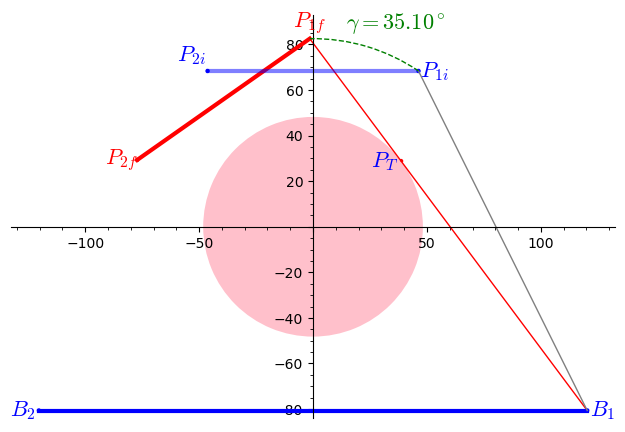

In [87]:
# Graphic representation
pc21=point([xc21,yc21],size=10)+text(r"$P_{2i}$",(xc21-7,yc21+7),fontsize=16)
pc22=point([xc22,yc22])+text(r"$P_{1i}$",(xc22+7,yc22),fontsize=16)
p=point([xf,yf],color='red')+text(r"$P_T$",(xf-7,yf),fontsize=16)
p0=point([x0,y0])+text(r"$B_1$",(x0+7,y0),fontsize=16)
p1=point([x1,y1])+text(r"$B_2$",(x1-7,y1),fontsize=16)
l1=line([(xf,yf),(x0,y0)],color='red')
pc2=point([xc2,yc2],color='red',size=2)+text(r"$P_{1f}$",(xc2,yc2+7),fontsize=16,color='red')
l2=line([(xf,yf),(xc2,yc2)],color='red')
cr1=disk((0,0),r_a,(0, 2*pi), color='pink')
cr2=arc(center=(0,0),r1=rtf,r2=rtf,angle=0,sector=(th2,arcxc2),linestyle="--",color='green')
locang=vector([(xc2+xc22)/2+14,(yc2+yc22)/2+14])
tcr2=text(r"$\gamma = {} ^\circ$".format(displ.n(digits=4)),locang,fontsize=16,color='green')
pc2ph2=point([xph2,yph2],color='red')+text(r"$P_{2f}$",(xph2-7,yph2),fontsize=16,color='red')
plat1=line([(xph2,yph2),(xc2,yc2)],thickness=3,color='red')
plat2=line([(xc21,yc21),(xc22,yc22)],thickness=3,alpha=0.5)
bs=line([(x0,y0),(x1,y1)],thickness=3)
cbl1=line([(x0,y0),(xc22,yc22)],color='gray')
# Ploting
grcol=p+p0+p1+l1+l2+pc2+cr1+cr2+pc21+pc22+pc2ph2+plat1+plat2+bs+cbl1+tcr2
show(grcol)
# grcol.save("collsim.svg",dpi=600,fig_tight=False,fontsize=14)

## Two Perpendicular Axis Analogous Mechanism
In this section, we analyze the four cable-driven two perpendicular axis, for a "dummy" shank-ankle-foot, then we extend the concept for the ankle model.

In [88]:
# Redefine the axis direction for dummy model
w1d=vector([0,1,0])
w2d=vector([1,0,0])
# redefine the r points
r1d=vector([0,0,-doa])
r2d=vector([0,0,-(doa+vQ)])
# Find the momentums
v1d=r1d.cross_product(w1d)
v2d=r2d.cross_product(w2d)
# Base points
bp1=vector([rbr,0,0])
bp2=vector([-rbr,0,0])
bp3=vector([0,-rbr,0])
bp4=vector([0,rbr,0])
# Platform initial points
zin=-(doa+daf)
pp1=vector([rpr,0,zin])
pp2=vector([-rpr,0,zin])
pp3=vector([0,-rpr,zin])
pp4=vector([0,rpr,zin])
pf0=vector([0,0,zin])


In [89]:
# kinematic chain
lskc=line([[PO[0],PO[2]],[r1d[0],r1d[2]]],color='pink',thickness=4)
ltkc=line([[r1d[0],r1d[2]],[r2d[0],r2d[2]]],color='pink',thickness=4)
lfkc=line([[r2d[0],r2d[2]],[pf0[0],pf0[2]]],color='pink',thickness=4)
pr1d=point([r1d[0],r1d[2]],size=100,color='red')+text(r"$\$_{34}$",(r1d[0]+7,r1d[2]+7),fontsize=14)
pr2d=point([r2d[0],r2d[2]],size=50)+text(r"$\$_{12}$",(r2d[0]+7,r2d[2]-7),fontsize=14)
kcnd=lskc+ltkc+lfkc+pr1d+pr2d

In [90]:
# rotate degrees to radians
d2r=pi/180
rtp=45*d2r
# rotate the cable positions at the base
bp1r=bp1*rotate_arbitrary((0,0,1),rtp)
bp2r=bp2*rotate_arbitrary((0,0,1),rtp)
bp3r=bp3*rotate_arbitrary((0,0,1),rtp)
bp4r=bp4*rotate_arbitrary((0,0,1),rtp)
# rotate the cable positions at the platform
pp1r=pp1*rotate_arbitrary((0,0,1),rtp)
pp2r=pp2*rotate_arbitrary((0,0,1),rtp)
pp3r=pp3*rotate_arbitrary((0,0,1),rtp)
pp4r=pp4*rotate_arbitrary((0,0,1),rtp)

In [91]:
# cable direction vectors
dc1=(bp1r-pp1r)/norm((bp1r-pp1r))
dc2=(bp2r-pp2r)/norm((bp2r-pp2r))
dc3=(bp3r-pp3r)/norm((bp3r-pp3r))
dc4=(bp4r-pp4r)/norm((bp4r-pp4r))
# Cable momentums
vc1=bp1r.cross_product(dc1)
vc2=bp2r.cross_product(dc2)
vc3=bp3r.cross_product(dc3)
vc4=bp4r.cross_product(dc4)

In [92]:
# Planar screw antagonistic cables system normal vector 1
# base
lbv1=line([[bp1[0],bp1[2]],[bp2[0],bp2[2]]],color='blue',thickness=3)
pbp1=point([bp1[0],bp1[2]],size=50)+text(r"$P_{b1}$",(bp1[0],bp1[2]+7),fontsize=14)
pbp2=point([bp2[0],bp2[2]],size=50)+text(r"$P_{b2}$",(bp2[0],bp2[2]+7),fontsize=14)
ppo=point([PO[0],PO[2]],size=50)+text(r"$P_O$",(7,7),fontsize=14)
bsxz=lbv1+pbp1+pbp2+ppo
# platform
lpv1=line([[pp1[0],pp1[2]],[pp2[0],pp2[2]]],color='blue',thickness=3)
ppp1=point([pp1[0],pp1[2]],size=50)+text(r"$P_{p1}$",(pp1[0],pp1[2]-7),fontsize=14)
ppp2=point([pp2[0],pp2[2]],size=50)+text(r"$P_{p2}$",(pp2[0],pp2[2]-7),fontsize=14)
ppf0=point([pf0[0],pf0[2]],size=50)+text(r"$P_M$",(pf0[0]+7,pf0[2]+7),fontsize=14)
ptxz=lpv1+ppp1+ppp2+ppf0
# cables
lc1v1=line([[bp1[0],bp1[2]],[pp1[0],pp1[2]]],color='gray',thickness=2)
lc2v1=line([[bp2[0],bp2[2]],[pp2[0],pp2[2]]],color='gray',thickness=2)

pr1d=point([r1d[0],r1d[2]],size=100,color='red')+text(r"$\$_{34}$",(r1d[0]+7,r1d[2]+7),fontsize=14)
pr2d=point([r2d[0],r2d[2]],size=50)+text(r"$\$_{12}$",(r2d[0]+7,r2d[2]-7),fontsize=14)

# screws
arv2=arrow((r2d[0],r2d[2]),(r2d[0]+30*w2d[0],r2d[2]+30*w2d[2]))
arc1=arrow((pp1[0],pp1[2]),(pp1[0]+30*dc1[0],pp1[2]+30*dc1[2]))+text(r"$\$_1$",(pp1[0]+7,pp1[2]+7),fontsize=14)
arc2=arrow((pp2[0],pp2[2]),(pp2[0]+30*dc2[0],pp2[2]+30*dc2[2]))+text(r"$\$_2$",(pp2[0]-7,pp2[2]+7),fontsize=14)
lrp1=line([[r1d[0],r1d[2]],[pp1[0],pp1[2]]],thickness=1,linestyle='--')
lrp2=line([[r1d[0],r1d[2]],[pp2[0],pp2[2]]],thickness=1,linestyle='--')
# Plot schematic on xz plane
plxz=bsxz+ptxz+lc1v1+lc2v1+kcnd+arv2+lrp1+lrp2+arc1+arc2
# plxz.save("scrwsim.svg",dpi=600,fig_tight=False,fontsize=14)
# plxz.show(fig_tight=False,fontsize=14)


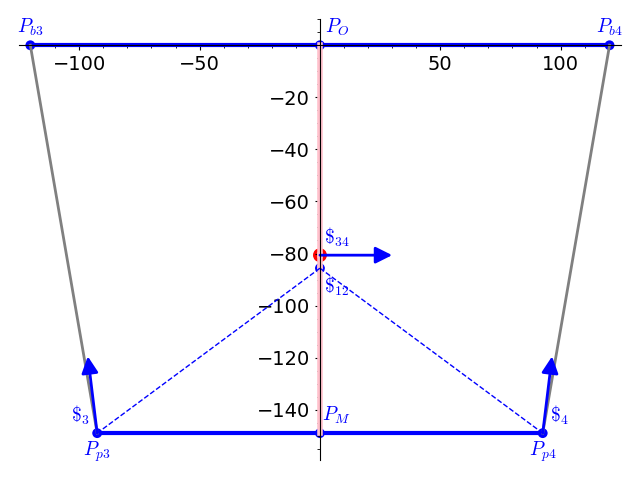

In [93]:
# Planar screw antagonistic cables system normal vector 2
# base
lbv2=line([[bp3[1],bp3[2]],[bp4[1],bp4[2]]],color='blue',thickness=3)
pbp3=point([bp3[1],bp3[2]],size=50)+text(r"$P_{b3}$",(bp3[1],bp3[2]+7),fontsize=14)
pbp4=point([bp4[1],bp4[2]],size=50)+text(r"$P_{b4}$",(bp4[1],bp4[2]+7),fontsize=14)
ppo=point([PO[1],PO[2]],size=50)+text(r"$P_O$",(7,7),fontsize=14)
bsyz=lbv2+pbp3+pbp4+ppo
# platform
lpv2=line([[pp3[1],pp3[2]],[pp4[1],pp4[2]]],color='blue',thickness=3)
ppp3=point([pp3[1],pp3[2]],size=50)+text(r"$P_{p3}$",(pp3[1],pp3[2]-7),fontsize=14)
ppp4=point([pp4[1],pp4[2]],size=50)+text(r"$P_{p4}$",(pp4[1],pp4[2]-7),fontsize=14)
ppf0=point([pf0[1],pf0[2]],size=50)+text(r"$P_M$",(pf0[1]+7,pf0[2]+7),fontsize=14)
ptyz=lpv2+ppp3+ppp4+ppf0
# cables
lc1v2=line([[bp3[1],bp3[2]],[pp3[1],pp3[2]]],color='gray',thickness=2)
lc2v2=line([[bp4[1],bp4[2]],[pp4[1],pp4[2]]],color='gray',thickness=2)
# screws
arv1=arrow((r1d[1],r1d[2]),(r1d[1]+30*w1d[1],r1d[2]+30*w1d[2]))
arc3=arrow((pp3[1],pp3[2]),(pp3[1]+30*dc3[1],pp3[2]+30*dc3[2]))+text(r"$\$_3$",(pp3[1]-7,pp3[2]+7),fontsize=14)
arc4=arrow((pp4[1],pp4[2]),(pp4[1]+30*dc4[1],pp4[2]+30*dc4[2]))+text(r"$\$_4$",(pp4[1]+7,pp4[2]+7),fontsize=14)
lrp3=line([[r2d[1],r2d[2]],[pp3[1],pp3[2]]],thickness=1,linestyle='--')
lrp4=line([[r2d[1],r2d[2]],[pp4[1],pp4[2]]],thickness=1,linestyle='--')
# Plot schematic on xz plane
plyz=bsyz+ptyz+lc1v2+lc2v2+kcnd+arv1+lrp3+lrp4+arc3+arc4
# plyz.save("scrwsim2.svg",dpi=600,fig_tight=False,fontsize=14)
plyz.show(fig_tight=False,fontsize=14)


In [94]:
# Print the points and vectors
print("Base point 1:",bp1r.n(digits=4))
print("Base point 2:",bp2r.n(digits=4))
print("Base point 3:",bp3r.n(digits=4))
print("Base point 4:",bp4r.n(digits=4))
print("Platform point 1:",pp1r.n(digits=4))
print("Platform point 2:",pp2r.n(digits=4))
print("Platform point 3:",pp3r.n(digits=4))
print("Platform point 4:",pp4r.n(digits=4))
print("Kinematic chain origin:",PO.n(digits=4))
print("Kinematic chain rotational 1:",r1d.n(digits=4))
print("Kinematic chain rotational 2:",r2d.n(digits=4))
print("Kinematic chain platform center:",pf0.n(digits=4))
print("Screw hinge 1:",w1d.n(digits=4),v1d.n(digits=4))
print("Screw hinge 2:",w2d.n(digits=4),v2d.n(digits=4))

Base point 1: (85.08, 85.08, 0.0000)
Base point 2: (-85.08, -85.08, 0.0000)
Base point 3: (85.08, -85.08, 0.0000)
Base point 4: (-85.08, 85.08, 0.0000)
Platform point 1: (65.45, 65.45, -149.0)
Platform point 2: (-65.45, -65.45, -149.0)
Platform point 3: (65.45, -65.45, -149.0)
Platform point 4: (-65.45, 65.45, -149.0)
Kinematic chain origin: (0.0000, 0.0000, 0.0000)
Kinematic chain rotational 1: (0.0000, 0.0000, -80.64)
Kinematic chain rotational 2: (0.0000, 0.0000, -85.64)
Kinematic chain platform center: (0.0000, 0.0000, -149.0)
Screw hinge 1: (0.0000, 1.000, 0.0000) (80.64, -0.0000, 0.0000)
Screw hinge 2: (1.000, 0.0000, 0.0000) (0.0000, -85.64, 0.0000)


In [95]:
#assemble the six dimensional vectors
from itertools import chain
# Screws for the axis
scrw1 =vector(chain(w1d,v1d))
scrw2 =vector(chain(w2d,v2d))
# screws for the cables
scrc1 =vector(chain(dc1,vc1))
scrc2 =vector(chain(dc2,vc2))
scrc3 =vector(chain(dc3,vc3))
scrc4 =vector(chain(dc4,vc4))

In [96]:
# reciprocal product from cables to axis 1
rp1w1=scrc1*scrw1
rp2w1=scrc2*scrw1
rp3w1=scrc3*scrw1
rp4w1=scrc4*scrw1
spw1=rp1w1+rp2w1+rp3w1+rp4w1
print("Reciprocals",rp1w1.n(digits=5),rp2w1.n(digits=5),rp3w1.n(digits=5),rp4w1.n(digits=5))
print("Sum:",spw1.n(digits=5))
# Torus rotation  hinge 1 direction
if spw1 == 0:
    tr1=Torus(R=10,r=1,color='gray').rotate(v1d,pi/2).translate(r1d+w1d*25)
elif spw1 > 0:
    tr1=Torus(R=10,r=1,color='blue').rotate(v1d,pi/2).translate(r1d+w1d*25)
elif spw1 < 0:
    tr1=Torus(R=10,r=1,color='red').rotate(v1d,pi/2).translate(r1d+w1d*25)

Reciprocals 6745.0 -6745.0 -6745.0 6745.0
Sum: 0.00000


In [97]:
# reciprocal product from cables to axis 2
rp1w2=scrc1*scrw2
rp2w2=scrc2*scrw2
rp3w2=scrc3*scrw2
rp4w2=scrc4*scrw2
spw2=rp1w2+rp2w2+rp3w2+rp4w2
print("Reciprocals",rp1w2.n(digits=5),rp2w2.n(digits=5),rp3w2.n(digits=5),rp4w2.n(digits=5))
print("Sum:",spw2.n(digits=5))

# Torus rotation  hinge 1 direction
if spw2 == 0:
    tr2=Torus(R=10,r=1,color='gray').rotate(v2d,pi/2).translate(r2d+w2d*25)
elif spw2 > 0:
    tr2=Torus(R=10,r=1,color='blue').rotate(v2d,pi/2).translate(r2d+w2d*25)
elif spw2 < 0 :
    tr2=Torus(R=10,r=1,color='red').rotate(v2d,pi/2).translate(r2d+w2d*25)

Reciprocals 7163.2 -7163.2 7163.2 -7163.2
Sum: 0.00000


In [98]:
# base Graphic representation
tbs=Torus(R=rbr,r=2)
dbp1=dot.translate(bp1r)
dbp2=dot.translate(bp2r)
lb12=line([bp1r,PO, bp2r], radius=2)
dbp3=dot.translate(bp3r)
dbp4=dot.translate(bp4r)
lb34=line([bp3r,PO, bp4r], radius=2)
bplt=tbs+dbp1+dbp2+lb12+dbp3+dbp4+lb34+dPO
# platform Graphic representation
tps=Torus(R=rpr,r=2,color='firebrick').translate(pf0)
dpp1=dot.translate(pp1r)
dpp2=dot.translate(pp2r)
lp12=line([pp1r,pf0, pp2r], radius=2)
dpp3=dot.translate(pp3r)
dpp4=dot.translate(pp4r)
dpf0=dot2.translate(pf0)
lp34=line([pp3r,pf0, pp4r], radius=2)
pplt=tps+dpp1+dpp2+lp12+dpp3+dpp4+lp34+dpf0
# kinematic chain
lsk=line([PO,r1d],radius=3, color='pink')
lts=line([r1d,r2d],radius=3, color='pink')
lft=line([r1d,pf0],radius=3, color='pink')
arw1=arrow(r1d,r1d+w1d*50,radius=1,color='darkgreen')
arw2=arrow(r2d,r2d+w2d*50,radius=1,color='darkblue')
dkc=lsk+lts+lft+arw1+arw2+tr1+tr2
# Cables
c1d=line([bp1r,pp1r],radius=0.5, color='grey')
c2d=line([bp2r,pp2r],radius=0.5, color='grey')
c3d=line([bp3r,pp3r],radius=0.5, color='grey')
c4d=line([bp4r,pp4r],radius=0.5, color='grey')
cbld=c1d+c2d+c3d+c4d
# Arrows cable direction]
ac1=arrow(pp1r,pp1r+dc1*50,radius=1,color='darkblue')
ac2=arrow(pp2r,pp2r+dc2*50,radius=1,color='darkblue')
ac3=arrow(pp3r,pp3r+dc3*50,radius=1,color='green')
ac4=arrow(pp4r,pp4r+dc4*50,radius=1,color='green')
# foot wide collision sphere
rdmx = sphere(r1d,fw/2, color='pink',opacity=0.5)
# Dummy configuration 1
dconf1=dkc+cbld+pplt+bplt+ac1+ac2+ac3+ac4 #+rdmx
dconf1.show()
# dconf1.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[3, 4, 3], # a distant camera position combined with 
#           zoom=2.45, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-2.77,-3.7,-2.8), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

## Attaching points angle configuration

In [99]:
# replace by mean values
w1=w1me
v1=v1me
w2=w2me
v2=v2me

# replace by maximum values
# w1=w1ma
# v1=v1ma
# w2=w2ma
# v2=v2ma

# replace by minimum values
# w1=w1mi
# v1=v1mi
# w2=w2mi
# v2=v2mi
print("w1,v1 =",w1.n(digits=3),v1.n(digits=3))
print("w2,v2 =",w2.n(digits=3),v2.n(digits=3))

w1,v1 = (-0.103, 0.979, 0.174) (106., 11.1, 0.000)
w2,v2 = (0.738, 0.208, 0.642) (23.2, -84.5, 0.682)


In [100]:
#plane 1
np1=w1.cross_product(vz)
#plane 2
np2=w2.cross_product(vz)
den=norm(np1)*norm(np2)
np1d2=np1.dot_product(np2)/den
#half angle gamma
gmh1=arccos(np1d2)/2
gmh2=(pi/2-gmh1)
print("Angles in radians:",gmh1.n(digits=5),gmh2.n(digits=5))
print("Angles in degrees:",(gmh1*180/pi).n(digits=4),(gmh2*180/pi).n(digits=4))

Angles in radians: 0.70045 0.87035
Angles in degrees: 40.13 49.87


In [101]:
#half angle rotation about z axis
w1r=np1*rotate_arbitrary(vz,-gmh1)
w2r=np2*rotate_arbitrary(vz,-gmh2)
print("Normal vectors: ",w1r.n(digits=5),w2r.n(digits=5))

Normal vectors:  (814.89, -552.28, 0.00000) (-430.17, -634.71, 0.00000)


The intersection between the circle centered on the pivot point and the line direction with vector directions normal to the half planes.

In [102]:
#circle intersection on platform
lr1=(x-xp)/w1r[0]==(y-yp)/w1r[1]
cr1=y==sqrt(rpr^2-(x-PMi[0])^2)+PMi[1]
sxyp=solve([lr1,cr1],x,y)
xpl=sxyp[0][0].rhs()
ypl=sxyp[0][1].rhs()
zpl=PMi[2]
aplf1=vector([xpl,ypl,zpl])
tapl1=text3d("aplf1", aplf1 +txo, color=(0.5,0,0))
papl1=dot.translate(aplf1) + tapl1
print("Attaching point platform w1 left:",(xpl.n(digits=4),ypl.n(digits=4),zpl.n(digits=4)))

Attaching point platform w1 left: (-76.52, 51.02, -176.2)


In [103]:
# angle rep for attachng point 1
tap1=atan2(aplf1[1],aplf1[0]).n()
cap1=parametric_plot([0.2*rpr*cos(t)+PMi[0],0.2*rpr*sin(t)+PMi[1]],(t,0,tap1),color='rosybrown',thickness=0.5)
print("Angle configuration attaching point 1","rad:",tap1.n(digits=5),"deg:",(tap1*180/pi).n(digits=5))

Angle configuration attaching point 1 rad: 2.5536 deg: 146.31


In [104]:
#circle intersection on platform
lr2=(x-xp)/w1r[0]==(y-yp)/w1r[1]
cr2=y==-sqrt(rpr^2-(x-PMi[0])^2)+PMi[1]
sxyp=solve([lr2,cr2],x,y)
xpr=sxyp[0][0].rhs()
ypr=sxyp[0][1].rhs()
zpr=PMi[2]
aprf1=vector([xpr,ypr,zpr])
tapr1=text3d("aprf1", aprf1 +txo, color=(0.5,0,0))
papr1=dot.translate(aprf1)+tapr1
print("Attaching point platform w1 rigth:",(xpr.n(digits=4),ypr.n(digits=4),zpr.n(digits=4)))

Attaching point platform w1 rigth: (76.72, -52.84, -176.2)


In [105]:
# angle rep for attachng point 2
tap2=atan2(aprf1[1],aprf1[0]).n()
cap2=parametric_plot([0.3*rpr*cos(t)+PMi[0],0.3*rpr*sin(t)+PMi[1]],(t,tap2,0),color='goldenrod',thickness=0.5)
print("Angle configuration attaching point 2","rad:",tap2.n(digits=5),"deg:",(tap2*180/pi).n(digits=5))

Angle configuration attaching point 2 rad: -0.60314 deg: -34.557


In [106]:
#circle intersection on platform
lr3=(x-xp)/w2r[0]==(y-yp)/w2r[1]
cr3=y==sqrt(rpr^2-(x-PMi[0])^2)+PMi[1]
sxyp=solve([lr3,cr3],x,y)
xpl=sxyp[0][0].rhs()
ypl=sxyp[0][1].rhs()
zpl=PMi[2]
aplf2=vector([xpl,ypl,zpl])
tapl2=text3d("aplf2", aplf2 +txo, color=(0.5,0,0))
papl2=dot.translate(aplf2)+tapl2
print("Attaching point platform w2 left:",(xpl.n(digits=4),ypl.n(digits=4),zpl.n(digits=4)))

Attaching point platform w2 left: (52.03, 75.71, -176.2)


In [107]:
# angle rep for attachng point 3
tap3=atan2(aplf2[1],aplf2[0]).n()
cap3=parametric_plot([0.4*rpr*cos(t)+PMi[0],0.4*rpr*sin(t)+PMi[1]],(t,0,tap3),color='mediumturquoise',thickness=0.5)
print("Angle configuration attaching point 3","rad:",tap3.n(digits=5),"deg:",(tap3*180/pi).n(digits=5))

Angle configuration attaching point 3 rad: 0.96873 deg: 55.504


In [108]:
#circle intersection on platform
lr4=(x-xp)/w2r[0]==(y-yp)/w2r[1]
cr4=y==-sqrt(rpr^2-(x-PMi[0])^2)+PMi[1]
sxyp=solve([lr4,cr4],x,y)
xpr=sxyp[0][0].rhs()
ypr=sxyp[0][1].rhs()
zpr=PMi[2]
aprf2=vector([xpr,ypr,zpr])
tapf2=text3d("aprf2", aprf2 +txo, color=(0.5,0,0))
papr2=dot.translate(aprf2)+tapf2
print("Attaching point platform w2 rigth:",(xpr.n(digits=4),ypr.n(digits=4),zpr.n(digits=4)))

Attaching point platform w2 rigth: (-51.83, -77.53, -176.2)


In [109]:
# angle rep for attachng point 4
tap4=atan2(aprf2[1],aprf2[0]).n()
cap4=parametric_plot([0.5*rpr*cos(t)+PMi[0],0.5*rpr*sin(t)+PMi[1]],(t,tap4,0),color='mediumpurple',thickness=0.5)
print("Angle configuration attaching point 4","rad:",tap4.n(digits=5),"deg:",(tap4*180/pi).n(digits=5))

Angle configuration attaching point 4 rad: -2.1601 deg: -123.76


In [110]:
#circle intersection on the base
lr1=(x-xp)/w1r[0]==(y-yp)/w1r[1]
cr1=y==sqrt(rbr^2-(x-POi[0])^2)+POi[1]
sxyp=solve([lr1,cr1],x,y)
xbl=sxyp[0][0].rhs()
ybl=sxyp[0][1].rhs()
zbl=POi[2]
ablf1=vector([xbl,ybl,zbl])
tabf1=text3d("ablf1", ablf1 +txo, color=(0.5,0,0))
pabl1=dot.translate(ablf1)+tabf1
print("Attaching point base w1 left:",(xbl.n(digits=4),ybl.n(digits=4),zbl.n(digits=4)))

Attaching point base w1 left: (-99.51, 66.59, 0.0000)


In [111]:
#circle intersection on the base
lr2=(x-xp)/w1r[0]==(y-yp)/w1r[1]
cr2=y==-sqrt(rbr^2-(x-POi[0])^2)+POi[1]
sxyp=solve([lr2,cr2],x,y)
xbr=sxyp[0][0].rhs()
ybr=sxyp[0][1].rhs()
zbr=POi[2]
abrf1=vector([xbr,ybr,zbr])
tabrf1=text3d("abrf1", abrf1 +txo, color=(0.5,0,0))
pabr1=dot.translate(abrf1)+tabrf1
print("Attaching point base w1 rigth:",(xbr.n(digits=4),ybr.n(digits=4),zbr.n(digits=4)))

Attaching point base w1 rigth: (99.70, -68.42, 0.0000)


In [112]:
#circle intersection on the base
lr3=(x-xp)/w2r[0]==(y-yp)/w2r[1]
cr3=y==sqrt(rbr^2-(x-POi[0])^2)+POi[1]
sxyp=solve([lr3,cr3],x,y)
xbl=sxyp[0][0].rhs()
ybl=sxyp[0][1].rhs()
zbl=POi[2]
ablf2=vector([xbl,ybl,zbl])
tabl2=text3d("ablf2", ablf2 +txo, color=(0.5,0,0))
pabl2=dot.translate(ablf2)+tabl2
print("Attaching point base w2 left:",(xbl.n(digits=4),ybl.n(digits=4),zbl.n(digits=4)))

Attaching point base w2 left: (67.60, 98.69, 0.0000)


In [113]:
#circle intersection on the base
lr4=(x-xp)/w2r[0]==(y-yp)/w2r[1]
cr4=y==-sqrt(rbr^2-(x-POi[0])^2)+POi[1]
sxyp=solve([lr4,cr4],x,y)
xbr=sxyp[0][0].rhs()
ybr=sxyp[0][1].rhs()
zbr=POi[2]
abrf2=vector([xbr,ybr,zbr])
tabrf2=text3d("abrf2", abrf2 +txo, color=(0.5,0,0))
pabr2=dot.translate(abrf2)+tabrf2
print("Attaching point base w2 rigth:",(xbr.n(digits=4),ybr.n(digits=4),zbr.n(digits=4)))

Attaching point base w2 rigth: (-67.41, -100.5, 0.0000)


In [114]:
#points position reconfiguration
gplt=papl1+papr1+papl2+papr2
gbas=pabl1+pabr1+pabl2+pabr2
gcfg=gplt+gbas

In [115]:
#projected lines base
lbf1=line3d([ablf1,abrf1],color='olive')
lbf2=line3d([ablf2,abrf2],color='olive')
#projected lines platform
lpf1=line3d([aplf1,aprf1],color='olive')
lpf2=line3d([aplf2,aprf2],color='olive')
#cables
lcl1=line3d([ablf1,aplf1],color='violet')
lcr1=line3d([abrf1,aprf1],color='violet')
lcl2=line3d([ablf2,aplf2],color='violet')
lcr2=line3d([abrf2,aprf2],color='violet')
gcbl=lcl1+lcr1+lcl2+lcr2
# Angles
gangl=cap1+cap2+cap3+cap4
#ankle serial kinematics
ankj=kchn+lbf1+lbf2+lpf1+lpf2+gcbl
grc=gcfg+ankj+xyzax(-50,50,-50,50,-50,50)+gangl
grc.show()
# grc.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[4, 5, 3.8], # a distant camera position combined with 
#           zoom=3.4, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-4.1,-5.1,-4.1), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [116]:
#segments
lsg1=norm(r_1i-POi)
lsg2=norm(r_2i-r_1i)
lsg3=norm(PMi-r_2i)
print("Segment lengths:",lsg1.n(digits=5),lsg2.n(digits=5),lsg3.n(digits=5))
print("Base:",rbr.n(digits=5),"Platform:",rpr.n(digits=5))

Segment lengths: 108.44 4.5946 64.279
Base: 120.33 Platform: 92.558


In [117]:
#attaching points initial position aligned to origin reference frame
gaprf1=matrix([[1,0,0,aprf1[0]],[0,1,0,aprf1[1]],[0,0,1,aprf1[2]],[0,0,0,1]])
gaplf1=matrix([[1,0,0,aplf1[0]],[0,1,0,aplf1[1]],[0,0,1,aplf1[2]],[0,0,0,1]])
gaprf2=matrix([[1,0,0,aprf2[0]],[0,1,0,aprf2[1]],[0,0,1,aprf2[2]],[0,0,0,1]])
gaplf2=matrix([[1,0,0,aplf2[0]],[0,1,0,aplf2[1]],[0,0,1,aplf2[2]],[0,0,0,1]])
gPMi=matrix([[1,0,0,PMi[0]],[0,1,0,PMi[1]],[0,0,1,PMi[2]],[0,0,0,1]])

#product of exponential matrix for the attaching point right line 1
Maprf1=MTH1*MTH2*gaprf1
#components of the platform vertices
f_xr1=Maprf1[0][3]
f_yr1=Maprf1[1][3]
f_zr1=Maprf1[2][3]

#product of exponential matrix for the attaching point left line 1
Maplf1=MTH1*MTH2*gaplf1
#components of the platform vertices
f_xl1=Maplf1[0][3]
f_yl1=Maplf1[1][3]
f_zl1=Maplf1[2][3]

#product of exponential matrix for the attaching point right line 2
Maprf2=MTH1*MTH2*gaprf2
#components of the platform vertices
f_xr2=Maprf2[0][3]
f_yr2=Maprf2[1][3]
f_zr2=Maprf2[2][3]

#product of exponential matrix for the attaching point left line 1
Maplf2=MTH1*MTH2*gaplf2
#components of the platform vertices
f_xl2=Maplf2[0][3]
f_yl2=Maplf2[1][3]
f_zl2=Maplf2[2][3]

#point r2_i transformation
gr_2i=matrix([[1,0,0,r_2i[0]],[0,1,0,r_2i[1]],[0,0,1,r_2i[2]],[0,0,0,1]])
Mr_2i=MTH1*gr_2i
f_xr2i=Mr_2i[0][3]
f_yr2i=Mr_2i[1][3]
f_zr2i=Mr_2i[2][3]

# pivot point transformation
MPMi=MTH1*MTH2*gPMi
f_xPMi=MPMi[0][3]
f_yPMi=MPMi[1][3]
f_zPMi=MPMi[2][3]

In [118]:
#group of movements of the attaching points
caprf1=parametric_plot3d([f_xr1, f_yr1, f_zr1],(theta_1, t1min, t1max), 
                        (theta_2, t2min, t2max),plot_points=[dp,dp])
caplf1=parametric_plot3d([f_xl1, f_yl1, f_zl1], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="cyan")
caprf2=parametric_plot3d([f_xr2, f_yr2, f_zr2], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="magenta")
caplf2=parametric_plot3d([f_xl2, f_yl2, f_zl2], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="yellow")
# group of movements of the pivot point
caPMi=parametric_plot3d([f_xPMi, f_yPMi, f_zPMi], (theta_1, t1min, t1max), 
                       (theta_2, t2min, t2max),plot_points=[dp,dp],texture="yellow")

grse=caprf1 + caplf1 + caprf2 + caplf2 + caPMi
atp= grse + grc 

atp.show()
# atp.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[4, 5, 3.8], # a distant camera position combined with 
#           zoom=3.4, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-4.1,-5.1,-4), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

## Cable lenghts at Initial Position
The cable lenghts are the difference between the location at the given estimated ankle angles and the base attaching points.

In [119]:
#initial cable lenghts
ilc1=norm(aplf1-ablf1)
ilc2=norm(aprf1-abrf1)
ilc3=norm(aplf2-ablf2)
ilc4=norm(aprf2-abrf2)
print("lengths in mm:",ilc1.n(digits=5),ilc2.n(digits=5),ilc3.n(digits=5),ilc4.n(digits=5))
#sphere representation
spc1=sphere(ablf1,ilc1,opacity=0.3)
spc2=sphere(abrf1,ilc2,opacity=0.3)
spc3=sphere(ablf2,ilc3,opacity=0.3)
spc4=sphere(abrf2,ilc4,opacity=0.3)
spcb=spc1+spc2+spc3+spc4
dirkin=spcb+atp
dirkin.show()
# dirkin.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[4, 5, -3.8], # a distant camera position combined with 
#           zoom=3.4, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-4.1,-5.1,4), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

lengths in mm: 178.35 178.35 178.35 178.35


Graphics3d Object

## Reconfiguration at Extreme Angles

In [120]:
#Attaching points given estimated angles
th1=t1max
th2=t2max
xr2i=f_xr2i.subs(theta_1==th1)
yr2i=f_yr2i.subs(theta_1==th1)
zr2i=f_zr2i.subs(theta_1==th1)
cr2i=vector([xr2i,yr2i,zr2i])
dr2i=dot.translate(cr2i)
cr2i.n(digits=4)

(1.361, -0.1503, -112.7)

In [121]:
#central point
nxpm= f_xpm.subs(theta_1==th1,theta_2==th2)
nypm= f_ypm.subs(theta_1==th1,theta_2==th2)
nzpm= f_zpm.subs(theta_1==th1,theta_2==th2)
napm=vector([nxpm,nypm,nzpm])
dnapm=dot.translate(napm)
napm.n(digits=4)

(-27.31, 8.175, -169.6)

In [122]:
xap1=f_xl1.subs(theta_1==th1,theta_2==th2)
yap1=f_yl1.subs(theta_1==th1,theta_2==th2)
zap1=f_zl1.subs(theta_1==th1,theta_2==th2)
cap1=vector([xap1,yap1,zap1])
dcap1=dot.translate(cap1)
cap1.n(digits=4)

(-103.9, 40.46, -130.3)

In [123]:
xap2=f_xr1.subs(theta_1==th1,theta_2==th2)
yap2=f_yr1.subs(theta_1==th1,theta_2==th2)
zap2=f_zr1.subs(theta_1==th1,theta_2==th2)
cap2=vector([xap2,yap2,zap2])
dcap2=dot.translate(cap2)
cap2.n(digits=4)

(49.78, -25.83, -209.4)

In [124]:
xap3=f_xl2.subs(theta_1==th1,theta_2==th2)
yap3=f_yl2.subs(theta_1==th1,theta_2==th2)
zap3=f_zl2.subs(theta_1==th1,theta_2==th2)
cap3=vector([xap3,yap3,zap3])
dcap3=dot.translate(cap3)
cap3.n(digits=4)

(8.315, 92.79, -172.7)

In [125]:
xap4=f_xr2.subs(theta_1==th1,theta_2==th2)
yap4=f_yr2.subs(theta_1==th1,theta_2==th2)
zap4=f_zr2.subs(theta_1==th1,theta_2==th2)
cap4=vector([xap4,yap4,zap4])
dcap4=dot.translate(cap4)
cap4.n(digits=4)

(-62.48, -78.16, -167.0)

In [126]:
#compute total rotation and axis logarithm
mtrpm=MPMi.subs(theta_1==th1,theta_2==th2)
apmr=acos(0.5*(mtrpm[[0, 1, 2],[0, 1, 2]].trace()-1))
skv=0.5*(mtrpm-mtrpm.transpose())/sin(apmr)
xskv=skv[1][2]
yskv=skv[2][0]
zskv=skv[0][1]
tskv=vector([xskv,yskv,zskv])
xvect=vector([1,0,0])
dvecf=arrow3d(PO,rpr*xvect,radius=1,color='red')
ntapm=(Torus(rpr,1)+dvecf).rotate(tskv,apmr).translate(napm)
ncon=dcap1+dcap2+dcap3+dcap4+dnapm+ntapm+dr2i+grse+radiusmax
# ncon.show()


In [127]:
#graphical structure of the ankle, platform and cable representations
#cables
lcap1=line3d([ablf1,cap1],color='violet')
lcap2=line3d([abrf1,cap2],color='violet')
lcap3=line3d([ablf2,cap3],color='violet')
lcap4=line3d([abrf2,cap4],color='violet')
lcp12=line3d([cap1,cap2],color='olive')
lcp23=line3d([cap3,cap4],color='olive')
gcap=lcap1+lcap2+lcap3+lcap4+lcp12+lcp23
#common perpendicular
lr1n2=line3d([r_1i,cr2i],radius=2,color='pink')
#platform center to the distal common perpendicular intersection point
lrn2pm=line3d([cr2i,napm],radius=2,color='pink')
#vector subtalar axis representation
wn2=w2*rotate_arbitrary(w1,th1*pi/180)
gwn2=arrow3d(cr2i,cr2i+50*wn2,radius=1,color='orange')
#ankle serial kinematics
ncab=lor1i+lbf1+lbf2+gw1+gwn2+btor+ncon+gcap+lr1n2+lrn2pm+grse+radiusmax
ngc=ncab+xyzax(-50,50,-50,50,-50,50)
ngc.show()
# ngc.show(viewer='tachyon', 
#           figsize=[20,20], # the image resolution is 100 figsize 
#           camera_position=[4, 5, 3.8], # a distant camera position combined with 
#           zoom=3.4, # a large zoom factor will decrease perspective distortion.  
#           viewdir=(-4.1,-5.1,-4), # slightly off-center
#           frame=false,
#           axes = false,
#           aspect_ratio=[1,1,1],)

Graphics3d Object

In [128]:
#cable lenghts
lc1=norm(cap1-ablf1)
lc2=norm(cap2-abrf1)
lc3=norm(cap3-ablf2)
lc4=norm(cap4-abrf2)
print("lengths:",lc1.n(digits=5),lc2.n(digits=5),lc3.n(digits=5),lc4.n(digits=5))
#sphere representation
spc1=sphere(ablf1,lc1,opacity=0.2)
spc2=sphere(abrf1,lc2,opacity=0.2)
spc3=sphere(ablf2,lc3,opacity=0.2)
spc4=sphere(abrf2,lc4,opacity=0.2)
spcb=spc1+spc2+spc3+spc4
dirkin=spcb+ngc
# dirkin

lengths: 133.02 219.41 182.69 168.58


## Prepare Data for Mujoco Simulator Initial Position
The units are in meters, also all points are rotated for horizontal representation and gravity response. We translate mm to cm.

In [129]:
#structure positive values for Mujoco simulator scaled to cm
rfp=(rotate_arbitrary([0,1,0],pi/2)*POi-PM0)/10
print("reference:",rfp[0].n(digits=7),rfp[1].n(digits=7),rfp[2].n(digits=7))

reference: 5.938405e-19 -0.09110710 17.62735


In [130]:
cylh=vector([0,0,4])
basem=(rotate_arbitrary([0,1,0],pi/2)*(POi+cylh)-PM0)/10
print("base cylinder fromto: ",basem[0].n(digits=7),basem[1].n(digits=7),basem[2].n(digits=7),
      rfp[0].n(digits=7),rfp[1].n(digits=7),rfp[2].n(digits=7),"size:",rbr/10)

base cylinder fromto:  -0.4000000 -0.09110710 17.62735 5.938405e-19 -0.09110710 17.62735 size: 12.0325920000000


In [131]:
#base attaching points positive values for Mujoco simulator scaled to cm
Pbl1=(rotate_arbitrary([0,1,0],pi/2)*ablf1-PM0)/10
print("b1:",Pbl1[0].n(digits=7),Pbl1[1].n(digits=7),Pbl1[2].n(digits=7))     

b1: -6.093131e-16 6.659522 7.666812


In [132]:
Pbr1=(rotate_arbitrary([0,1,0],pi/2)*abrf1-PM0)/10
print("b2:",Pbr1[0].n(digits=7),Pbr1[1].n(digits=7),Pbr1[2].n(digits=7))   

b2: 6.105008e-16 -6.841736 27.58788


In [133]:
Pbl2=(rotate_arbitrary([0,1,0],pi/2)*ablf2-PM0)/10
print("b3:",Pbl2[0].n(digits=7),Pbl2[1].n(digits=7),Pbl2[2].n(digits=7))   

b3: 4.139506e-16 9.869429 24.37798


In [134]:
Pbr2=(rotate_arbitrary([0,1,0],pi/2)*abrf2-PM0)/10
print("b4:",Pbr2[0].n(digits=7),Pbr2[1].n(digits=7),Pbr2[2].n(digits=7))   

b4: -4.127630e-16 -10.05164 10.87672


In [135]:
#structure positive values for Mujoco simulator scaled to cm
Pr1=(rotate_arbitrary([0,1,0],pi/2)*r_1i-PM0)/10
print("leg capsule fromto:",rfp[0].n(digits=7),rfp[1].n(digits=7),rfp[2].n(digits=7),
      Pr1[0].n(digits=7),Pr1[1].n(digits=7),Pr1[2].n(digits=7))
print("shnk pos:",Pr1[0].n(digits=7),Pr1[1].n(digits=7),Pr1[2].n(digits=7))

leg capsule fromto: 5.938405e-19 -0.09110710 17.62735 10.84427 -0.1037934 17.62868
shnk pos: 10.84427 -0.1037934 17.62868


In [136]:
Pr2=(rotate_arbitrary([0,1,0],pi/2)*r_2i-PM0)/10
print("comp capsule fromto:",Pr1[0].n(digits=7),Pr1[1].n(digits=7),Pr1[2].n(digits=7),
      Pr2[0].n(digits=7),Pr2[1].n(digits=7),Pr2[2].n(digits=7))

comp capsule fromto: 10.84427 -0.1037934 17.62868 11.19642 -0.01170672 17.90907


In [137]:
Pw1=(rotate_arbitrary([0,1,0],pi/2))*w1
print("TC hinge pos:",Pr1[0].n(digits=7),Pr1[1].n(digits=7),Pr1[2].n(digits=7),
      "axis:",Pw1[0].n(digits=7),Pw1[1].n(digits=7),Pw1[2].n(digits=7))

TC hinge pos: 10.84427 -0.1037934 17.62868 axis: -0.1740000 0.9790000 -0.1030000


In [138]:
PPM=(rotate_arbitrary([0,1,0],pi/2)*PMi-PM0)/10
print("b-foot capsule fromto:",Pr2[0].n(digits=7),Pr2[1].n(digits=7),Pr2[2].n(digits=7),
      PPM[0].n(digits=7),PPM[1].n(digits=7),PPM[2].n(digits=7))

b-foot capsule fromto: 11.19642 -0.01170672 17.90907 17.61765 -0.09110710 17.62735


In [139]:
Pw2=(rotate_arbitrary([0,1,0],pi/2))*w2
print("ST hinge pos:",Pr2[0].n(digits=7),Pr2[1].n(digits=7),Pr2[2].n(digits=7),
      "axis",Pw2[0].n(digits=7),Pw2[1].n(digits=7),Pw2[2].n(digits=7))

ST hinge pos: 11.19642 -0.01170672 17.90907 axis -0.6420000 0.2080000 0.7380000


In [140]:
PPMb=(rotate_arbitrary([0,1,0],pi/2)*(PMi-cylh)-PM0)/10
print("ptfm cylinder fromto:",PPM[0].n(digits=7),PPM[1].n(digits=7),PPM[2].n(digits=5),
      PPMb[0].n(digits=7),PPMb[1].n(digits=7),PPMb[2].n(digits=7),"size:",rpr/10)

ptfm cylinder fromto: 17.61765 -0.09110710 17.627 18.01765 -0.09110710 17.62735 size: 9.25584000000000


In [141]:
print("a-foot refpos:",-Pr1[0].n(digits=7),-Pr1[1].n(digits=7),-Pr1[2].n(digits=7))

a-foot refpos: -10.84427 0.1037934 -17.62868


In [142]:
#platform attaching points positive values for Mujoco and Opensim simulators scaled to cm
Ppl1=(rotate_arbitrary([0,1,0],pi/2)*aplf1-PM0)/10
print("p1:",Ppl1[0].n(digits=7),Ppl1[1].n(digits=7),Ppl1[2].n(digits=7))      

p1: 17.61765 5.101684 9.965397


In [143]:
Ppr1=(rotate_arbitrary([0,1,0],pi/2)*aprf1-PM0)/10
print("p2:",Ppr1[0].n(digits=7),Ppr1[1].n(digits=7),Ppr1[2].n(digits=7))  

p2: 17.61765 -5.283899 25.28930


In [144]:
Ppl2=(rotate_arbitrary([0,1,0],pi/2)*aplf2-PM0)/10
print("p3:",Ppl2[0].n(digits=7),Ppl2[1].n(digits=7),Ppl2[2].n(digits=7))

p3: 17.61765 7.570844 22.82014


In [145]:
Ppr2=(rotate_arbitrary([0,1,0],pi/2)*aprf2-PM0)/10
print("p4:",Ppr2[0].n(digits=7),Ppr2[1].n(digits=7),Ppr2[2].n(digits=7))  

p4: 17.61765 -7.753058 12.43456


In [146]:
#cable lenghts for Mujoco simulator scaled to cm
print("t1 range:",0.1*(ilc1-0.001).n(digits=7),0.1*ilc1.n(digits=7))

t1 range: 17.83503 17.83513


In [147]:
print("t2 range:",0.1*(ilc2-0.001).n(digits=7),0.1*ilc2.n(digits=7))

t2 range: 17.83503 17.83513


In [148]:
print("t3 range:",0.1*(ilc3-0.001).n(digits=7),0.1*ilc3.n(digits=7))

t3 range: 17.83503 17.83513


In [149]:
print("t4 range:",0.1*(ilc4-0.001).n(digits=7),0.1*ilc4.n(digits=7))

t4 range: 17.83503 17.83513


## Reconfiguration and Data for Mujoco Statics Simulation
In this section, we change the angles to compute the new configuration and the cable lenghts. The base, the leg, and shank are the same. The common perpendicular segment, the TC axis, the platform, the foot capsule, the foot mesh and the attaching points must be changed to a new position.

In [150]:
#cable lenghts for Mujoco simulator scaled to cm
slc1=lc1/10
print("t1 range:",(slc1-0.001).n(digits=6),slc1.n(digits=6))

t1 range: 13.3005 13.3015


In [151]:
slc2=lc2/10
print("t2 range:",(slc2-0.001).n(digits=6),slc2.n(digits=6))

t2 range: 21.9404 21.9414


In [152]:
slc3=lc3/10
print("t3 range:",(slc3-0.001).n(digits=6),slc3.n(digits=6))

t3 range: 18.2678 18.2688


In [153]:
slc4=lc4/10
print("t4 range:",(slc4-0.001).n(digits=6),slc4.n(digits=6))

t4 range: 16.8570 16.8580
